# Contents
* [Introduction](#Introduction)
* [Imports and configuration](#Imports-and-configuration)
* [Data loading](#Data-loading)
* [SGDOneClassSVM](#SGDOneClassSVM)
* [OneClassSVM](#OneClassSVM)
* [Discussion](#Discussion)

# Introduction

This notebook explores the viability of a triple one-class SVM (with SGD) approach. The three SVM predictions may be used themselves for classification or may be treated as extracted features.

# Imports and configuration

In [1]:
from time import time

notebook_begin_time = time()

# set random seeds

from os import environ
from random import seed as random_seed
from numpy.random import seed as np_seed
from tensorflow.random import set_seed


def reset_seeds(seed: int) -> None:
    """Utility function for resetting random seeds"""
    environ["PYTHONHASHSEED"] = str(seed)
    random_seed(seed)
    np_seed(seed)
    set_seed(seed)


reset_seeds(SEED := 2021)
del environ
del random_seed
del np_seed
del set_seed
del reset_seeds

In [2]:
# extensions
%load_ext autotime
%load_ext lab_black
%load_ext nb_black

In [18]:
# core
import numpy as np
import pandas as pd

# utility
from gc import collect as gc_collect

# faster pandas & sklearn
import swifter
from sklearnex import patch_sklearn

patch_sklearn()
del patch_sklearn

# metrics
from imblearn.metrics import geometric_mean_score
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    roc_auc_score,
)

# other sklearn
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import RidgeClassifier, SGDOneClassSVM
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.svm import OneClassSVM

# visualization
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("notebook")
%matplotlib inline

# display outputs w/o print calls
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
del InteractiveShell

# hide warnings
import warnings

# warnings.filterwarnings("ignore")
del warnings

time: 10 ms


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [4]:
# Location of cross validation data
FRILL_FEATHERS_FOLDER = "../1.0-mic-extract_FRILL_embeddings"

# Location where this notebook will output
DATA_OUT_FOLDER = "."

_ = gc_collect()

time: 180 ms


# Load data

In [5]:
data = pd.read_feather(f"{FRILL_FEATHERS_FOLDER}/dev_FRILL.feather").set_index("id")
labels = pd.read_feather(f"{FRILL_FEATHERS_FOLDER}/dev_labels.feather").set_index("id")
data.head()
data.info()
labels.head()
labels.info()

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
id,,,,,,,,,,,,,,,,,,,,,
0,0.119926,-0.049218,0.039702,0.141101,0.044318,0.049631,0.016178,0.025797,-0.104466,-0.016044,...,-0.226529,-0.091773,0.028184,-0.074794,0.025474,0.046511,-0.002693,-0.017953,-0.146394,-0.062330
2,0.101377,-0.063714,-0.015971,-0.151561,-0.065328,-0.013746,0.008821,0.010461,-0.030857,-0.010367,...,-0.169826,0.051789,0.114774,-0.033263,-0.071615,-0.040535,-0.050813,0.021136,-0.189459,0.040756
4,-0.028015,-0.041617,0.012599,-0.031460,0.021788,0.039503,0.033654,0.114422,-0.080653,-0.032090,...,0.059661,0.020316,0.044898,0.008499,0.009812,-0.047551,0.085392,0.029538,0.057070,-0.029945
6,-0.008712,-0.003798,-0.052170,0.030298,0.049662,0.039806,0.056743,-0.186714,-0.151110,0.021191,...,0.107442,0.053569,-0.067552,-0.017051,-0.109469,-0.082999,-0.049325,0.031638,-0.027172,0.006479
8,-0.000265,-0.050629,-0.005011,-0.169305,-0.087526,-0.022268,-0.020403,-0.149949,-0.047235,0.032980,...,-0.128375,0.128055,0.047202,-0.024305,-0.168291,0.112876,0.017571,0.078376,0.099279,-0.046610


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 17703 entries, 0 to 39247
Columns: 2048 entries, 0 to 2047
dtypes: float32(2048)
memory usage: 138.4 MB


,index,file,source,length,speaker_id,speaker_gender,lang1,emo,valence,neg,neu,pos
id,,,,,,,,,,,,
0,0,00000+aesdd+aesdd.1+f+ang+-1+ell+el-gr.wav,aesdd,medium,aesdd.1,f,ell,ang,0,True,False,False
2,2,00002+aesdd+aesdd.3+m+ang+-1+ell+el-gr.wav,aesdd,medium,aesdd.3,m,ell,ang,0,True,False,False
4,4,00004+aesdd+aesdd.5+f+ang+-1+ell+el-gr.wav,aesdd,medium,aesdd.5,f,ell,ang,0,True,False,False
6,6,00006+aesdd+aesdd.1+f+ang+-1+ell+el-gr.wav,aesdd,medium,aesdd.1,f,ell,ang,0,True,False,False
8,8,00008+aesdd+aesdd.3+m+ang+-1+ell+el-gr.wav,aesdd,medium,aesdd.3,m,ell,ang,0,True,False,False


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 17703 entries, 0 to 39247
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   index           17703 non-null  int64   
 1   file            17703 non-null  object  
 2   source          17703 non-null  category
 3   length          17703 non-null  category
 4   speaker_id      17703 non-null  category
 5   speaker_gender  17703 non-null  category
 6   lang1           17703 non-null  category
 7   emo             17703 non-null  category
 8   valence         17703 non-null  int8    
 9   neg             17703 non-null  bool    
 10  neu             17703 non-null  bool    
 11  pos             17703 non-null  bool    
dtypes: bool(3), category(6), int64(1), int8(1), object(1)
memory usage: 650.1+ KB
time: 828 ms


# SGDOneClassSVM

-- Epoch 1
Norm: 2.46, NNZs: 2048, Bias: -3.224103, T: 7655, Avg. loss: 0.315540
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.355925, T: 15310, Avg. loss: 0.353570
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2.55, NNZs: 2048, Bias: -3.422072, T: 22965, Avg. loss: 0.369431
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 2.57, NNZs: 2048, Bias: -3.465348, T: 30620, Avg. loss: 0.379753
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 2.58, NNZs: 2048, Bias: -3.500424, T: 38275, Avg. loss: 0.382819
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.59, NNZs: 2048, Bias: -3.524422, T: 45930, Avg. loss: 0.389959
Total training time: 0.20 seconds.
Convergence after 6 epochs took 0.20 seconds
-- Epoch 1
Norm: 2.61, NNZs: 2048, Bias: -3.907823, T: 3227, Avg. loss: 0.253882
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.69, NNZs: 2048, Bias: -4.108831, T: 6454, Avg. loss: 0.295583
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2.75,

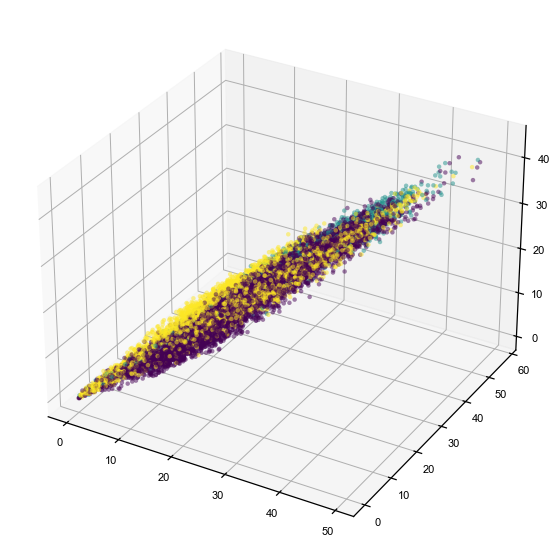

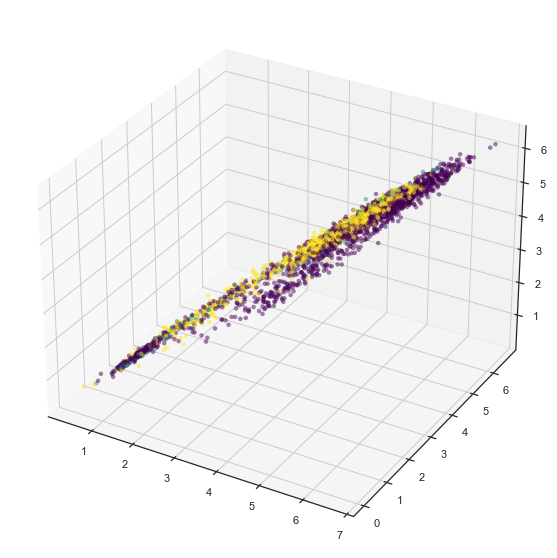

accuracy: 

0.6244047619047619

adjusted balanced accuracy: 

0.08692824956324173

f1: 

0.5326415208468993

geometric mean: 

0.22287651373163977

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 58906.79it/s]


0.5446646051916597

-- Epoch 1
Norm: 2.44, NNZs: 2048, Bias: -3.330160, T: 8708, Avg. loss: 0.381215
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.441786, T: 17416, Avg. loss: 0.430769
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2.53, NNZs: 2048, Bias: -3.504407, T: 26124, Avg. loss: 0.441010
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2.55, NNZs: 2048, Bias: -3.543305, T: 34832, Avg. loss: 0.453409
Total training time: 0.21 seconds.
-- Epoch 5
Norm: 2.56, NNZs: 2048, Bias: -3.575862, T: 43540, Avg. loss: 0.455392
Total training time: 0.27 seconds.
-- Epoch 6
Norm: 2.57, NNZs: 2048, Bias: -3.598649, T: 52248, Avg. loss: 0.463562
Total training time: 0.36 seconds.
Convergence after 6 epochs took 0.36 seconds
-- Epoch 1
Norm: 2.51, NNZs: 2048, Bias: -3.845877, T: 2936, Avg. loss: 0.311835
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.61, NNZs: 2048, Bias: -4.047860, T: 5872, Avg. loss: 0.361203
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2.67,

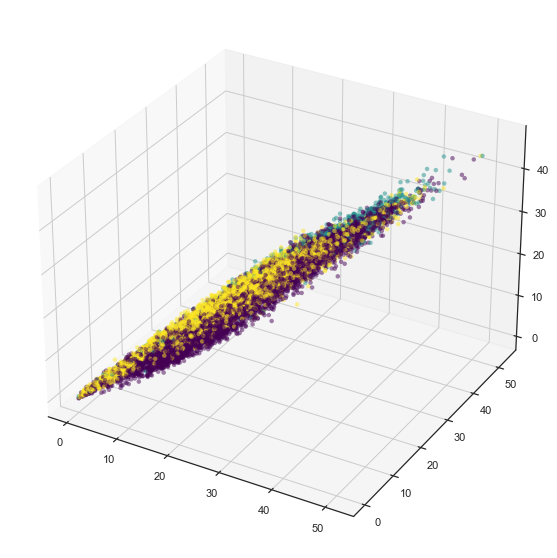

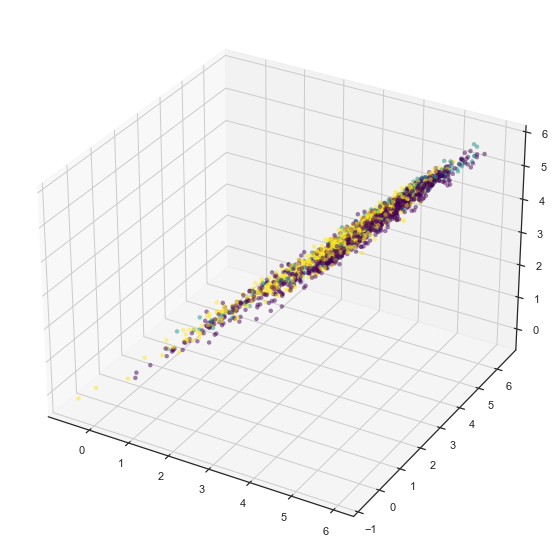

accuracy: 

0.4388459975619667

adjusted balanced accuracy: 

0.08027872627830156

f1: 

0.36877252291288953

geometric mean: 

0.26823398570938967

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 74511.18it/s]


0.5395036125754491

-- Epoch 1
Norm: 2.41, NNZs: 2048, Bias: -3.179556, T: 8154, Avg. loss: 0.380827
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.45, NNZs: 2048, Bias: -3.300474, T: 16308, Avg. loss: 0.418376
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2.48, NNZs: 2048, Bias: -3.356025, T: 24462, Avg. loss: 0.441136
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 2.50, NNZs: 2048, Bias: -3.399257, T: 32616, Avg. loss: 0.447199
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 2.51, NNZs: 2048, Bias: -3.429162, T: 40770, Avg. loss: 0.454426
Total training time: 0.17 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 2048, Bias: -3.452580, T: 48924, Avg. loss: 0.460470
Total training time: 0.20 seconds.
Convergence after 6 epochs took 0.20 seconds
-- Epoch 1
Norm: 2.53, NNZs: 2048, Bias: -3.650849, T: 3114, Avg. loss: 0.283790
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 2.61, NNZs: 2048, Bias: -3.832237, T: 6228, Avg. loss: 0.325970
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 2.65,

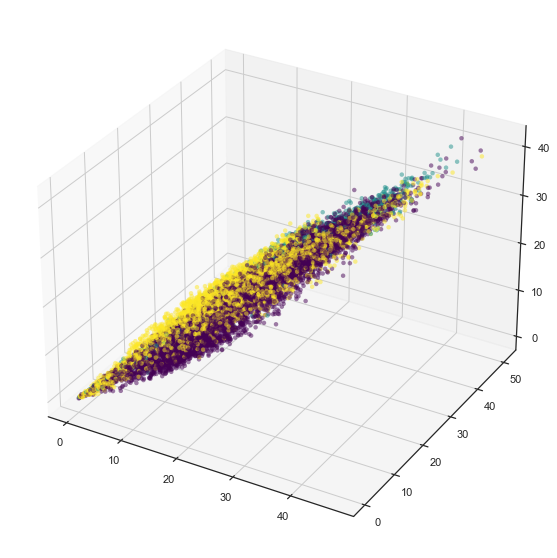

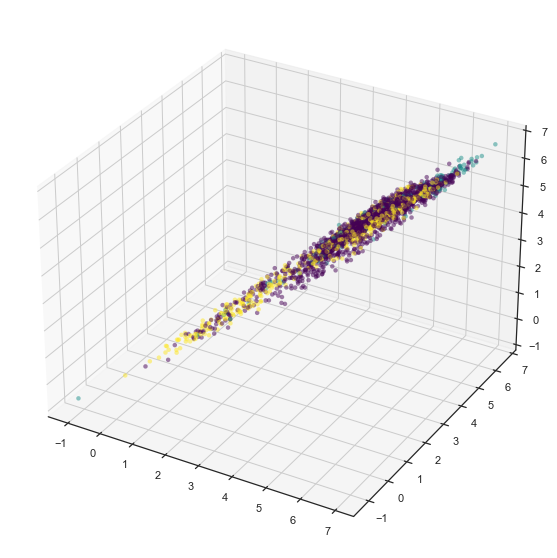

accuracy: 

0.572928821470245

adjusted balanced accuracy: 

0.049264023525658195

f1: 

0.49644015950818643

geometric mean: 

0.20110434228437765

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 25188.10it/s]


0.5251938081362131

-- Epoch 1
Norm: 2.33, NNZs: 2048, Bias: -2.796767, T: 6297, Avg. loss: 0.327470
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.38, NNZs: 2048, Bias: -2.886671, T: 12594, Avg. loss: 0.360874
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 2.41, NNZs: 2048, Bias: -2.929721, T: 18891, Avg. loss: 0.370353
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 2.42, NNZs: 2048, Bias: -2.960396, T: 25188, Avg. loss: 0.372199
Total training time: 0.11 seconds.
-- Epoch 5
Norm: 2.43, NNZs: 2048, Bias: -2.982739, T: 31485, Avg. loss: 0.377911
Total training time: 0.14 seconds.
-- Epoch 6
Norm: 2.45, NNZs: 2048, Bias: -2.997554, T: 37782, Avg. loss: 0.381805
Total training time: 0.17 seconds.
Convergence after 6 epochs took 0.17 seconds
-- Epoch 1
Norm: 2.48, NNZs: 2048, Bias: -3.365610, T: 2385, Avg. loss: 0.283466
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.56, NNZs: 2048, Bias: -3.526329, T: 4770, Avg. loss: 0.317641
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.59,

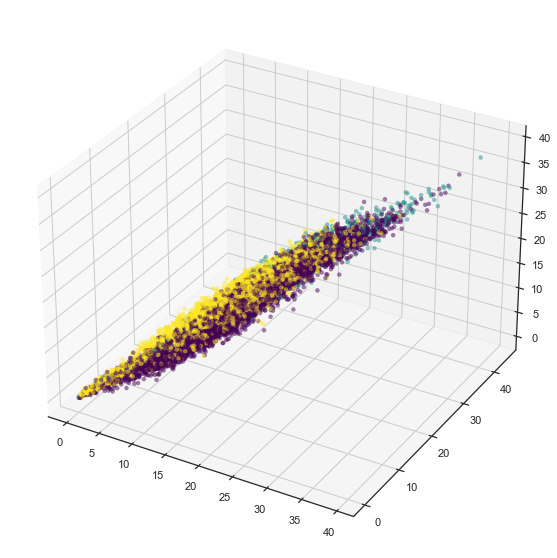

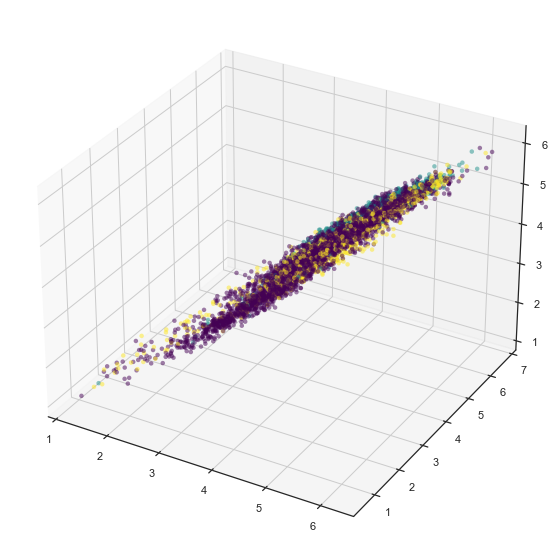

accuracy: 

0.5738261024816997

adjusted balanced accuracy: 

0.002529319910003602

f1: 

0.47534289056544515

geometric mean: 

0.12070208042471162

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 55970.69it/s]


0.5036627531628237

-- Epoch 1
Norm: 2.46, NNZs: 2048, Bias: -3.373722, T: 8010, Avg. loss: 0.395347
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.491986, T: 16020, Avg. loss: 0.440089
Total training time: 0.10 seconds.
-- Epoch 3
Norm: 2.54, NNZs: 2048, Bias: -3.552153, T: 24030, Avg. loss: 0.456730
Total training time: 0.14 seconds.
-- Epoch 4
Norm: 2.55, NNZs: 2048, Bias: -3.593055, T: 32040, Avg. loss: 0.466459
Total training time: 0.18 seconds.
-- Epoch 5
Norm: 2.57, NNZs: 2048, Bias: -3.623898, T: 40050, Avg. loss: 0.473158
Total training time: 0.21 seconds.
-- Epoch 6
Norm: 2.58, NNZs: 2048, Bias: -3.648257, T: 48060, Avg. loss: 0.479039
Total training time: 0.25 seconds.
Convergence after 6 epochs took 0.25 seconds
-- Epoch 1
Norm: 2.51, NNZs: 2048, Bias: -3.724119, T: 2550, Avg. loss: 0.302786
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.60, NNZs: 2048, Bias: -3.929048, T: 5100, Avg. loss: 0.352011
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2.65,

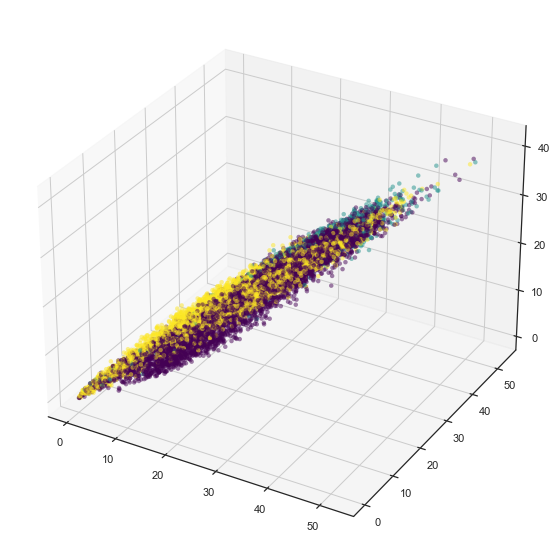

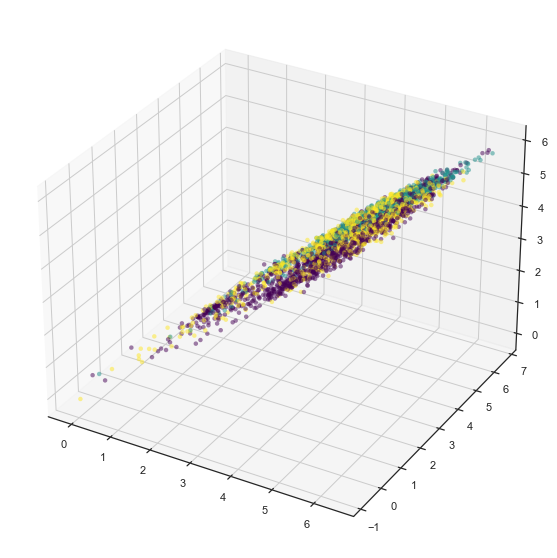

accuracy: 

0.5110512129380054

adjusted balanced accuracy: 

0.12398703888102407

f1: 

0.41743934713664826

geometric mean: 

0.1944282761299719

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 46342.04it/s]


0.5657107308947966

time: 48.8 s


In [6]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    nystroem_neg = Nystroem(random_state=SEED, n_jobs=-1).fit(
        neg_data := x_train.loc[labels.valence == 0]
    )
    nystroem_neu = Nystroem(random_state=SEED, n_jobs=-1).fit(
        neu_data := x_train.loc[labels.valence == 1]
    )
    nystroem_pos = Nystroem(random_state=SEED, n_jobs=-1).fit(
        pos_data := x_train.loc[labels.valence == 2]
    )
    neg_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        # nystroem_neg.transform(neg_data)
        neg_data
    )
    neu_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        # nystroem_neu.transform(neu_data)
        neu_data
    )
    pos_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        # nystroem_pos.transform(pos_data)
        pos_data
    )
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                # "oc_neg": neg_classifier.score_samples(nystroem_neg.transform(x_train)),
                # "oc_neu": neu_classifier.score_samples(nystroem_neu.transform(x_train)),
                # "oc_pos": pos_classifier.score_samples(nystroem_pos.transform(x_train)),
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train := labels.iloc[train_idx].loc[:, "valence"],
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"] * x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"] * x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"] * x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    X_test = pd.DataFrame(
        {
            # "oc_neg": neg_classifier.score_samples(nystroem_neg.transform(X_test)),
            # "oc_neu": neu_classifier.score_samples(nystroem_neu.transform(X_test)),
            # "oc_pos": pos_classifier.score_samples(nystroem_pos.transform(X_test)),
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()
    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [7]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

accuracy:  0.5442113792713357
adjusted balanced accuracy:  0.06859747163164584
f1 0.4581272881940137
geometric mean:  0.20146903965601815
roc_auc:  0.5357471019921884
time: 5.01 ms


-- Epoch 1
Norm: 1.95, NNZs: 100, Bias: -0.933666, T: 7655, Avg. loss: 0.001633
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.96, NNZs: 100, Bias: -0.944380, T: 15310, Avg. loss: 0.001097
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.96, NNZs: 100, Bias: -0.949335, T: 22965, Avg. loss: 0.001089
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 100, Bias: -0.951966, T: 30620, Avg. loss: 0.001076
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 1.97, NNZs: 100, Bias: -0.954127, T: 38275, Avg. loss: 0.001069
Total training time: 0.04 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 100, Bias: -0.955505, T: 45930, Avg. loss: 0.001079
Total training time: 0.05 seconds.
Convergence after 6 epochs took 0.05 seconds
-- Epoch 1
Norm: 1.93, NNZs: 100, Bias: -0.914480, T: 3227, Avg. loss: 0.002175
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.94, NNZs: 100, Bias: -0.932763, T: 6454, Avg. loss: 0.001038
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 1.95, NNZs: 1

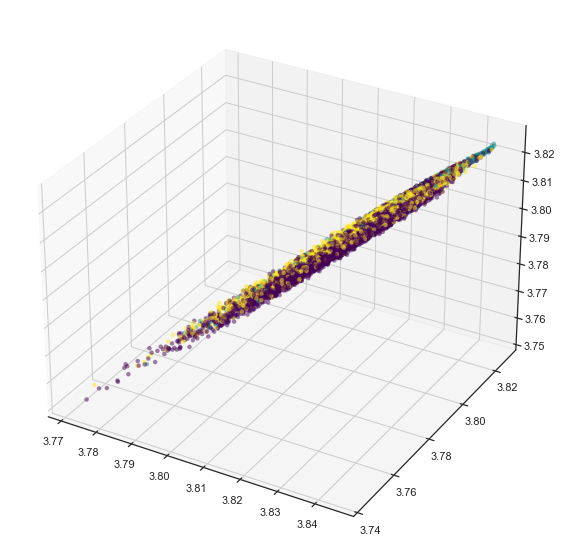

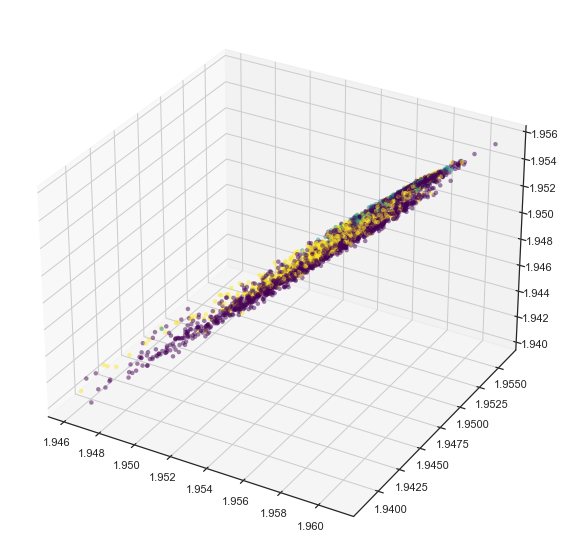

accuracy: 

0.6104166666666667

adjusted balanced accuracy: 

0.0

f1: 

0.46274795170332045

geometric mean: 

0.0

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 71428.59it/s]


0.5

-- Epoch 1
Norm: 1.95, NNZs: 100, Bias: -0.936192, T: 8708, Avg. loss: 0.001577
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.96, NNZs: 100, Bias: -0.946134, T: 17416, Avg. loss: 0.001100
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.96, NNZs: 100, Bias: -0.950487, T: 26124, Avg. loss: 0.001083
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 100, Bias: -0.953539, T: 34832, Avg. loss: 0.001077
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 1.97, NNZs: 100, Bias: -0.955449, T: 43540, Avg. loss: 0.001073
Total training time: 0.04 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 100, Bias: -0.956682, T: 52248, Avg. loss: 0.001085
Total training time: 0.04 seconds.
Convergence after 6 epochs took 0.04 seconds
-- Epoch 1
Norm: 1.92, NNZs: 100, Bias: -0.912252, T: 2936, Avg. loss: 0.002234
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.94, NNZs: 100, Bias: -0.930584, T: 5872, Avg. loss: 0.001023
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 1.95, NNZs: 1

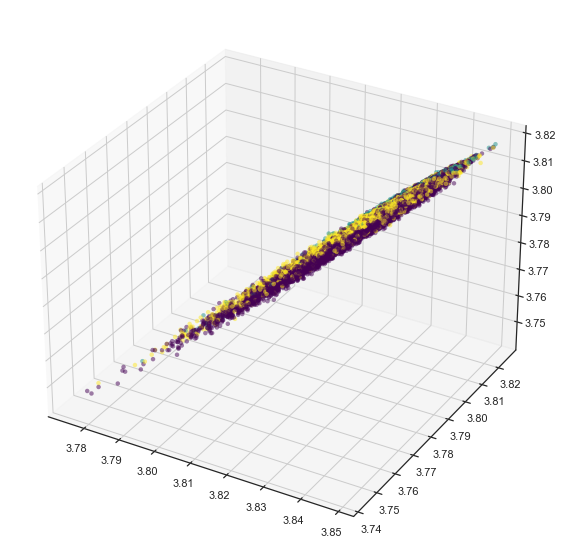

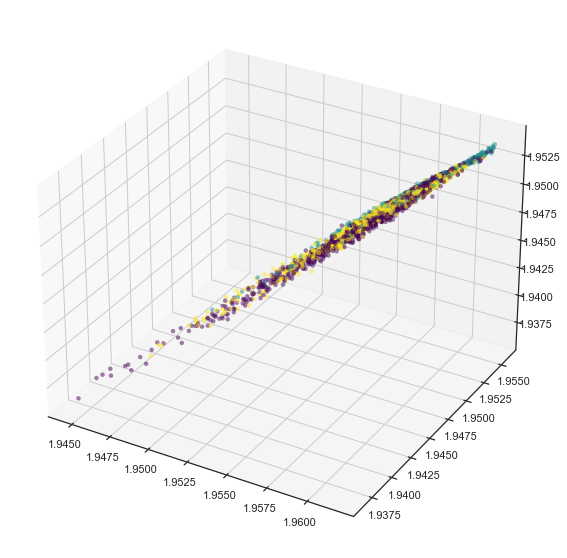

accuracy: 

0.40552620885818774

adjusted balanced accuracy: 

0.0

f1: 

0.23400702887567007

geometric mean: 

0.0

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 51232.30it/s]


0.5

-- Epoch 1
Norm: 1.95, NNZs: 100, Bias: -0.935009, T: 8154, Avg. loss: 0.001578
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.96, NNZs: 100, Bias: -0.945602, T: 16308, Avg. loss: 0.001113
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.96, NNZs: 100, Bias: -0.949693, T: 24462, Avg. loss: 0.001089
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 100, Bias: -0.952655, T: 32616, Avg. loss: 0.001080
Total training time: 0.06 seconds.
-- Epoch 5
Norm: 1.97, NNZs: 100, Bias: -0.954801, T: 40770, Avg. loss: 0.001084
Total training time: 0.07 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 100, Bias: -0.956098, T: 48924, Avg. loss: 0.001080
Total training time: 0.09 seconds.
Convergence after 6 epochs took 0.09 seconds
-- Epoch 1
Norm: 1.93, NNZs: 100, Bias: -0.916188, T: 3114, Avg. loss: 0.002362
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.94, NNZs: 100, Bias: -0.932981, T: 6228, Avg. loss: 0.001060
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 1.95, NNZs: 1

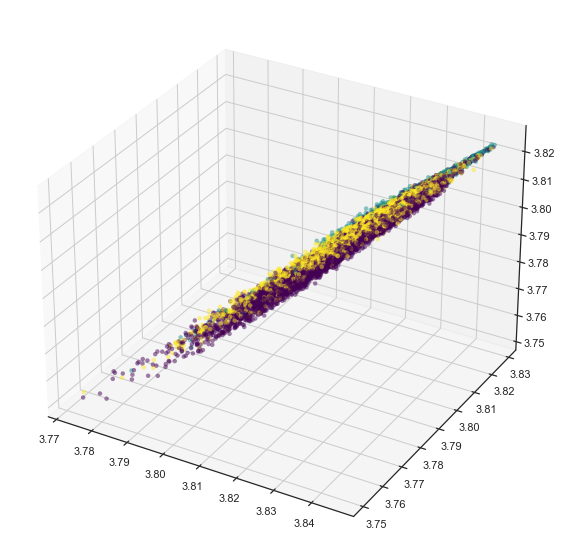

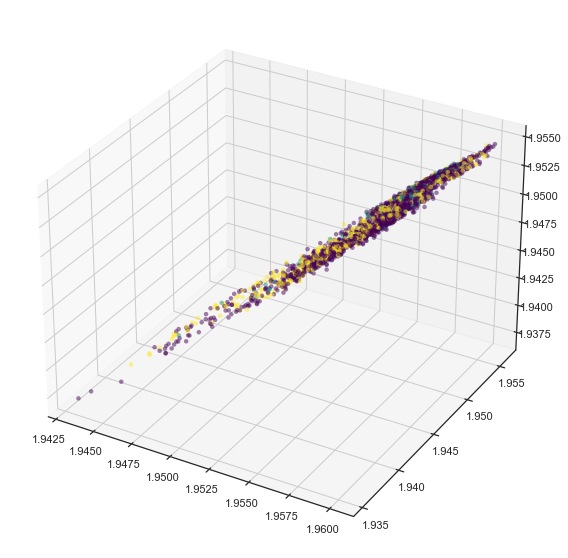

accuracy: 

0.603656164916375

adjusted balanced accuracy: 

0.0

f1: 

0.45446246323076106

geometric mean: 

0.0

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 71357.57it/s]


0.5

-- Epoch 1
Norm: 1.94, NNZs: 100, Bias: -0.930512, T: 6297, Avg. loss: 0.001880
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.96, NNZs: 100, Bias: -0.942250, T: 12594, Avg. loss: 0.001246
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.96, NNZs: 100, Bias: -0.947768, T: 18891, Avg. loss: 0.001221
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 1.96, NNZs: 100, Bias: -0.950610, T: 25188, Avg. loss: 0.001224
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 1.97, NNZs: 100, Bias: -0.952969, T: 31485, Avg. loss: 0.001212
Total training time: 0.04 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 100, Bias: -0.954644, T: 37782, Avg. loss: 0.001219
Total training time: 0.04 seconds.
Convergence after 6 epochs took 0.04 seconds
-- Epoch 1
Norm: 1.92, NNZs: 100, Bias: -0.905237, T: 2385, Avg. loss: 0.002920
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.94, NNZs: 100, Bias: -0.927556, T: 4770, Avg. loss: 0.001417
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.95, NNZs: 1

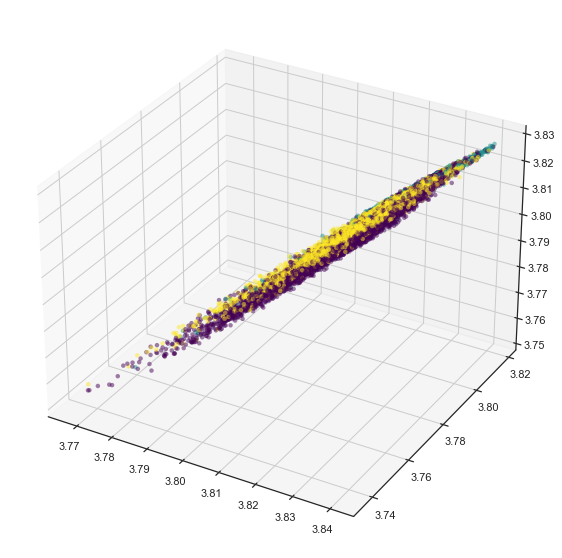

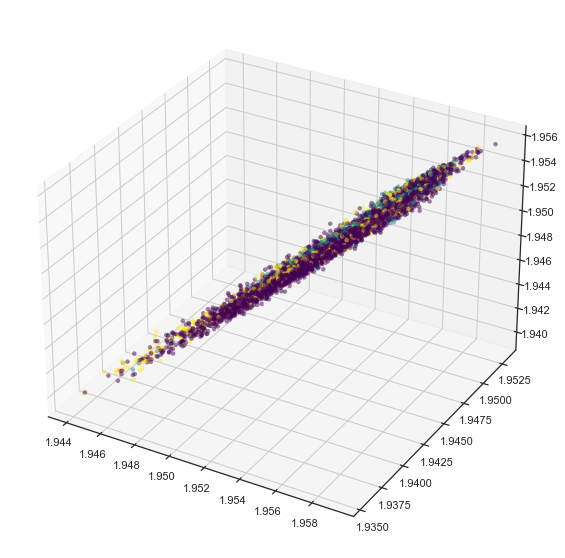

accuracy: 

0.6086413140510624

adjusted balanced accuracy: 

0.0

f1: 

0.460567866725876

geometric mean: 

0.0

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 164621.40it/s]


0.5

-- Epoch 1
Norm: 1.95, NNZs: 100, Bias: -0.934208, T: 8010, Avg. loss: 0.001602
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.96, NNZs: 100, Bias: -0.945683, T: 16020, Avg. loss: 0.001082
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 1.96, NNZs: 100, Bias: -0.950053, T: 24030, Avg. loss: 0.001081
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 1.97, NNZs: 100, Bias: -0.953030, T: 32040, Avg. loss: 0.001079
Total training time: 0.02 seconds.
-- Epoch 5
Norm: 1.97, NNZs: 100, Bias: -0.954984, T: 40050, Avg. loss: 0.001067
Total training time: 0.04 seconds.
-- Epoch 6
Norm: 1.97, NNZs: 100, Bias: -0.955983, T: 48060, Avg. loss: 0.001074
Total training time: 0.04 seconds.
Convergence after 6 epochs took 0.04 seconds
-- Epoch 1
Norm: 1.92, NNZs: 100, Bias: -0.908320, T: 2550, Avg. loss: 0.002616
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.94, NNZs: 100, Bias: -0.927894, T: 5100, Avg. loss: 0.001055
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 1.95, NNZs: 1

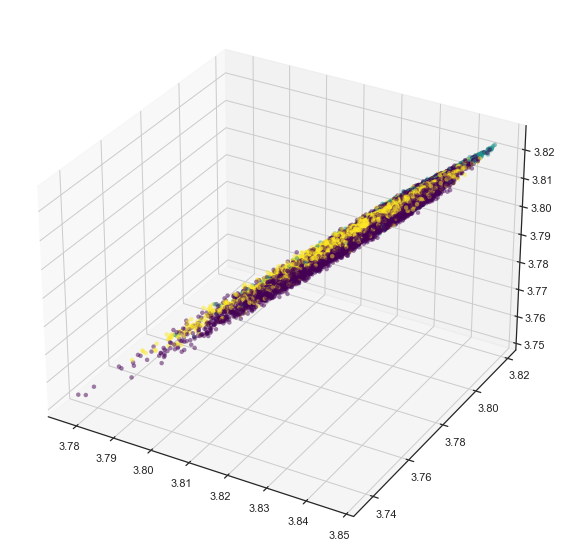

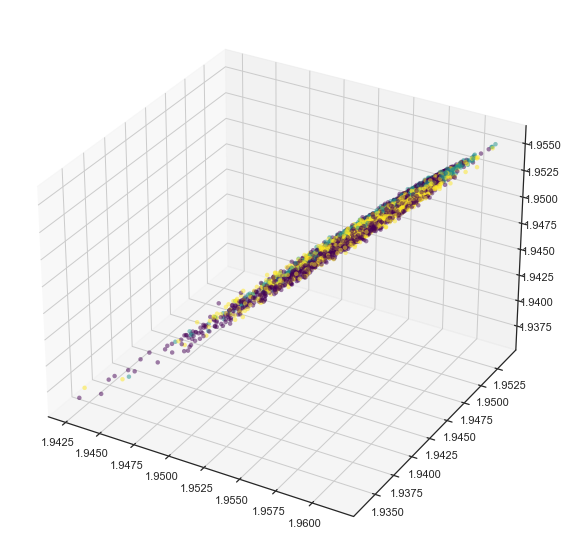

accuracy: 

0.45714285714285713

adjusted balanced accuracy: 

0.0

f1: 

0.28683473389355746

geometric mean: 

0.0

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 31182.98it/s]


0.5

time: 1min 2s


In [12]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    nystroem_neg = Nystroem(random_state=SEED, n_jobs=-1).fit(
        neg_data := x_train.loc[labels.valence == 0]
    )
    nystroem_neu = Nystroem(random_state=SEED, n_jobs=-1).fit(
        neu_data := x_train.loc[labels.valence == 1]
    )
    nystroem_pos = Nystroem(random_state=SEED, n_jobs=-1).fit(
        pos_data := x_train.loc[labels.valence == 2]
    )
    neg_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        nystroem_neg.transform(neg_data)
    )
    neu_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        nystroem_neu.transform(neu_data)
    )
    pos_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        nystroem_pos.transform(pos_data)
    )
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(nystroem_neg.transform(x_train)),
                "oc_neu": neu_classifier.score_samples(nystroem_neu.transform(x_train)),
                "oc_pos": pos_classifier.score_samples(nystroem_pos.transform(x_train)),
            }
        ),
        y_train := labels.iloc[train_idx].loc[:, "valence"],
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"] * x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"] * x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"] * x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(nystroem_neg.transform(X_test)),
            "oc_neu": neu_classifier.score_samples(nystroem_neu.transform(X_test)),
            "oc_pos": pos_classifier.score_samples(nystroem_pos.transform(X_test)),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()
    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [13]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

accuracy:  0.5370766423270299
adjusted balanced accuracy:  0.0
f1 0.379724008885837
geometric mean:  0.0
roc_auc:  0.5
time: 4 ms


# OneClassSVM

Let's try again without SGD and with an rbf kernel.

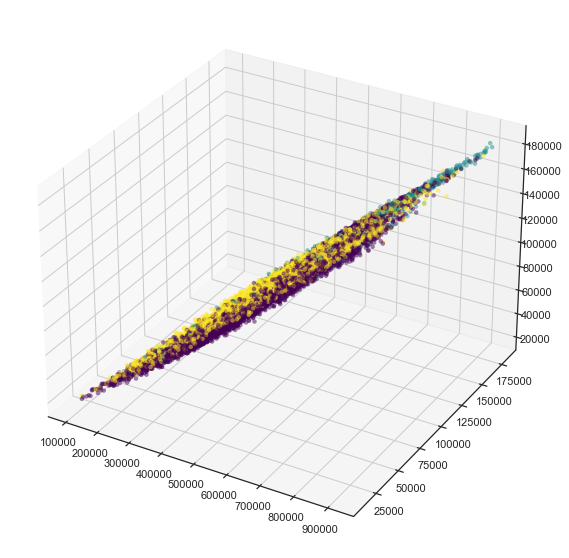

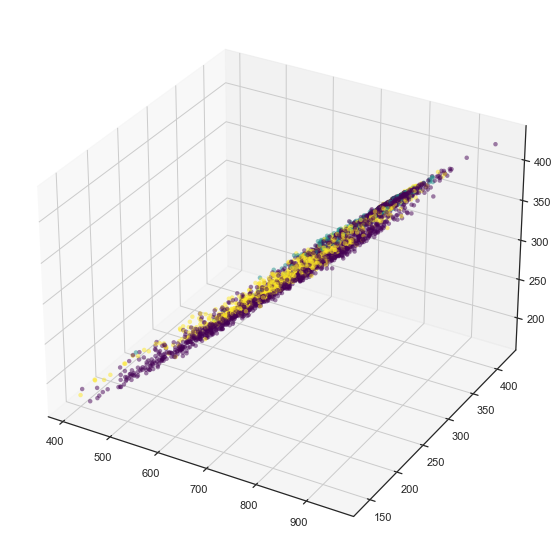

accuracy: 

0.5669642857142857

adjusted balanced accuracy: 

0.15870168028859008

f1: 

0.5331969995539253

geometric mean: 

0.3570127169318773

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 72989.00it/s]


0.5778822797418441

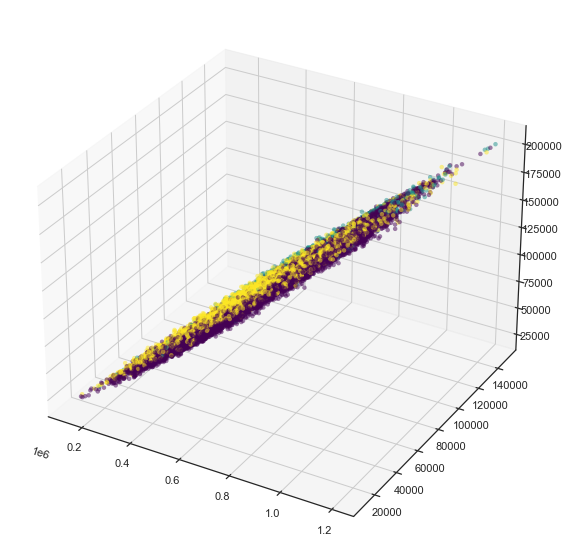

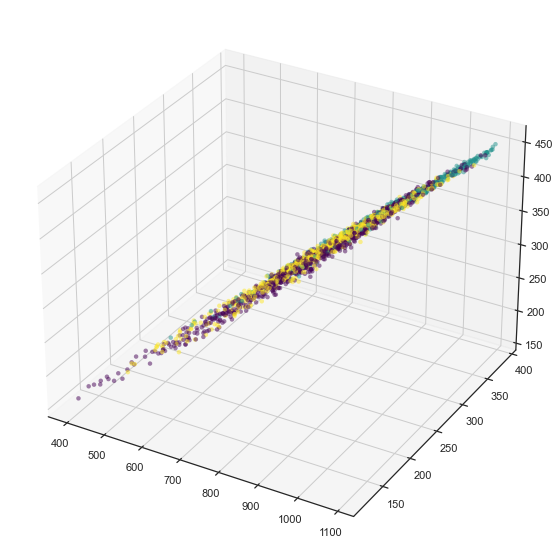

accuracy: 

0.4599756196668021

adjusted balanced accuracy: 

0.1235489723388138

f1: 

0.4052759465858089

geometric mean: 

0.32254165916490024

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 98372.08it/s]


0.5603839216442597

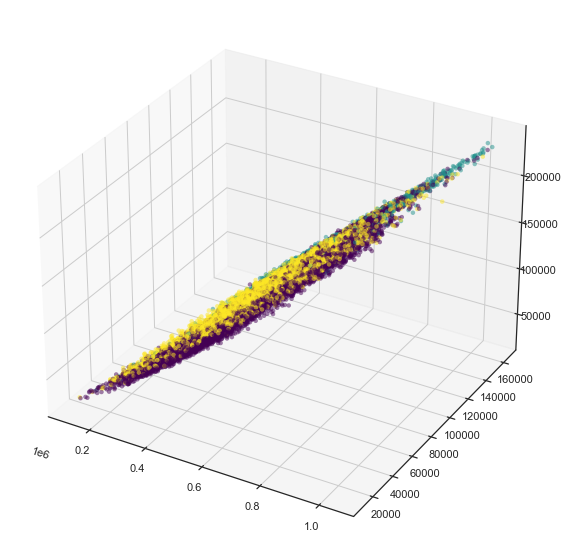

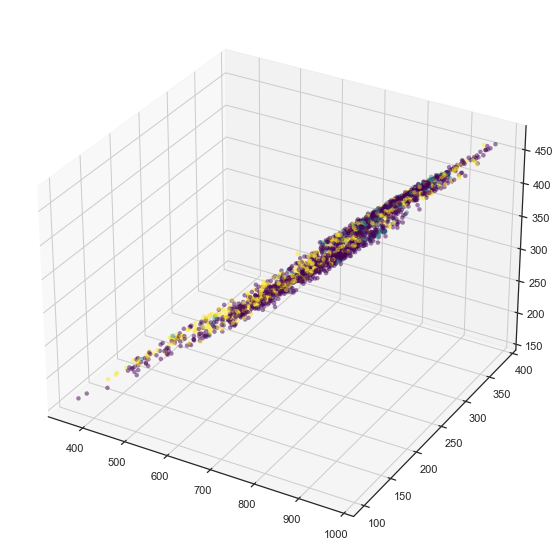

accuracy: 

0.5488136911707506

adjusted balanced accuracy: 

0.1376729735518546

f1: 

0.524306701535302

geometric mean: 

0.3497142234517808

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 62656.11it/s]


0.5671745469810482

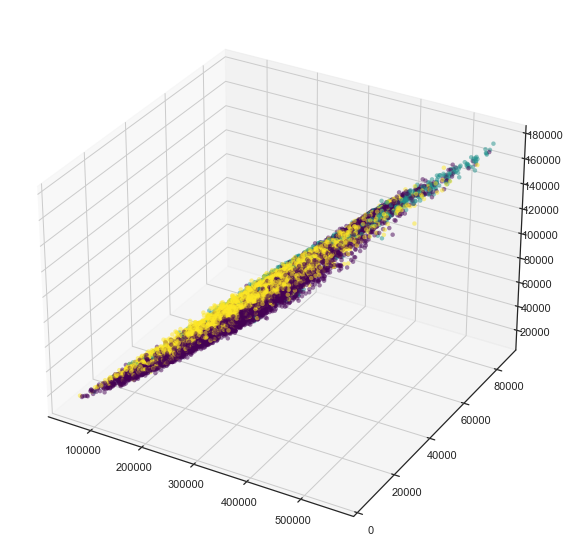

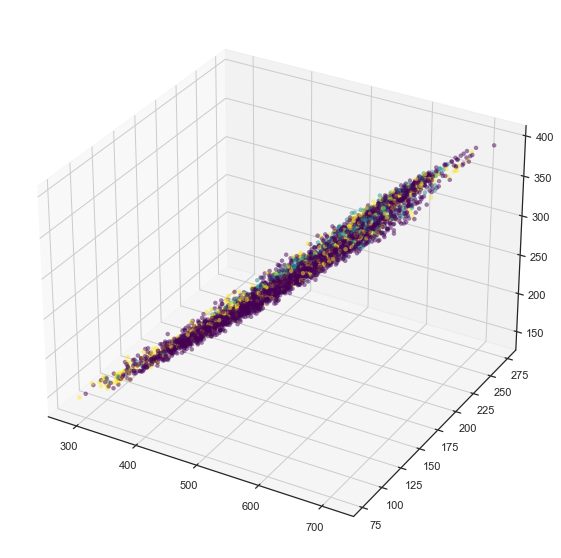

accuracy: 

0.599178718086056

adjusted balanced accuracy: 

0.03539849033531308

f1: 

0.49765974900042836

geometric mean: 

0.1513396774945393

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 105571.97it/s]


0.5179532581801705

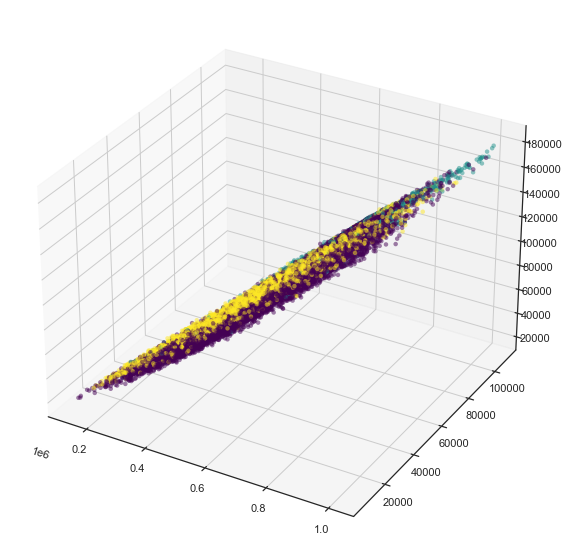

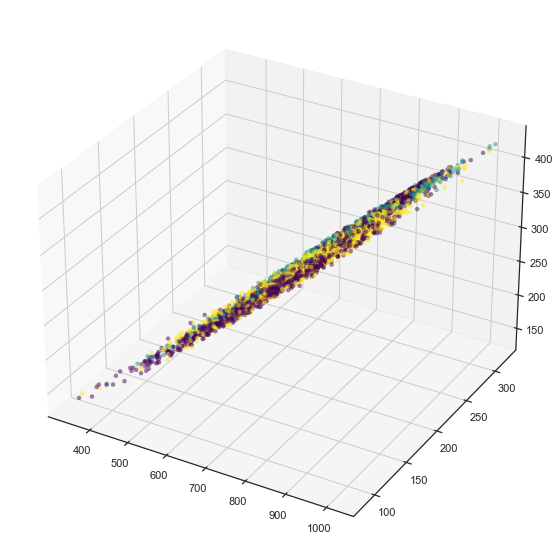

accuracy: 

0.44609164420485176

adjusted balanced accuracy: 

0.057658295641973244

f1: 

0.39391970567248474

geometric mean: 

0.2782233257078137

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 237349.46it/s]


0.5284193148762504

time: 36min 50s


In [8]:
accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    neg_data = x_train.loc[labels.valence == 0]
    neu_data = x_train.loc[labels.valence == 1]
    pos_data = x_train.loc[labels.valence == 2]

    neg_classifier = OneClassSVM().fit(neg_data)
    neu_classifier = OneClassSVM().fit(neu_data)
    pos_classifier = OneClassSVM().fit(pos_data)
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train := labels.iloc[train_idx].loc[:, "valence"],
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"] * x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"] * x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"] * x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()
    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [10]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5242047917685493
adjusted balanced accuracy:  0.10259608243130895
f1 0.47087182046958986
geometric mean:  0.29176632055018226
roc_auc:  0.5503626642847146
time: 344 ms


from above for reference
* accuracy:  0.5442113792713357
* adjusted balanced accuracy:  0.06859747163164584
* f1 0.4581272881940137
* geometric mean:  0.20146903965601815
* roc_auc:  0.5357471019921884

# Discussion

The SGD method was way faster and scored better in all metrics except accuracy. I tried the SGD method with a Nystroem transform too, but no skill was attained.

What if we use just the Nystroem transform?

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14343 samples in 0.027s...
[t-SNE] Computed neighbors for 14343 samples in 1.337s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14343
[t-SNE] Computed conditional probabilities for sample 2000 / 14343
[t-SNE] Computed conditional probabilities for sample 3000 / 14343
[t-SNE] Computed conditional probabilities for sample 4000 / 14343
[t-SNE] Computed conditional probabilities for sample 5000 / 14343
[t-SNE] Computed conditional probabilities for sample 6000 / 14343
[t-SNE] Computed conditional probabilities for sample 7000 / 14343
[t-SNE] Computed conditional probabilities for sample 8000 / 14343
[t-SNE] Computed conditional probabilities for sample 9000 / 14343
[t-SNE] Computed conditional probabilities for sample 10000 / 14343
[t-SNE] Computed conditional probabilities for sample 11000 / 14343
[t-SNE] Computed conditional probabilities for sample 12000 / 14343
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

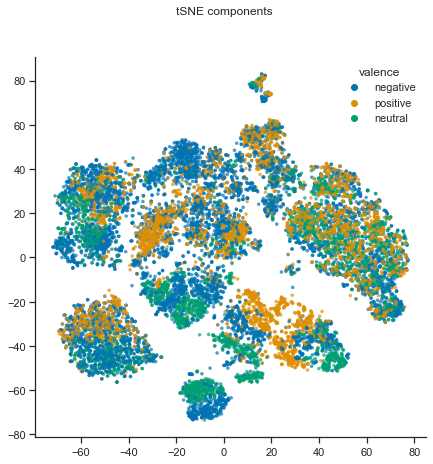

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3360 samples in 0.003s...
[t-SNE] Computed neighbors for 3360 samples in 0.237s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3360
[t-SNE] Computed conditional probabilities for sample 2000 / 3360
[t-SNE] Computed conditional probabilities for sample 3000 / 3360
[t-SNE] Computed conditional probabilities for sample 3360 / 3360
[t-SNE] Mean sigma: 0.014544
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.228813
[t-SNE] KL divergence after 1000 iterations: 1.375143


<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

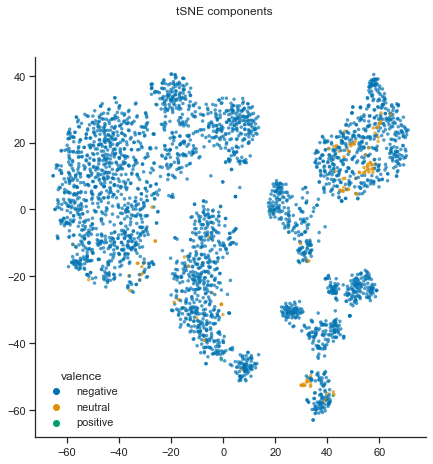

accuracy: 

0.6193452380952381

adjusted balanced accuracy: 

0.08163574827336274

f1: 

0.49317861586591444

geometric mean: 

0.0807127011737001

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 95919.40it/s]


0.5379723944740361

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15242 samples in 0.010s...
[t-SNE] Computed neighbors for 15242 samples in 2.129s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15242
[t-SNE] Computed conditional probabilities for sample 2000 / 15242
[t-SNE] Computed conditional probabilities for sample 3000 / 15242
[t-SNE] Computed conditional probabilities for sample 4000 / 15242
[t-SNE] Computed conditional probabilities for sample 5000 / 15242
[t-SNE] Computed conditional probabilities for sample 6000 / 15242
[t-SNE] Computed conditional probabilities for sample 7000 / 15242
[t-SNE] Computed conditional probabilities for sample 8000 / 15242
[t-SNE] Computed conditional probabilities for sample 9000 / 15242
[t-SNE] Computed conditional probabilities for sample 10000 / 15242
[t-SNE] Computed conditional probabilities for sample 11000 / 15242
[t-SNE] Computed conditional probabilities for sample 12000 / 15242
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

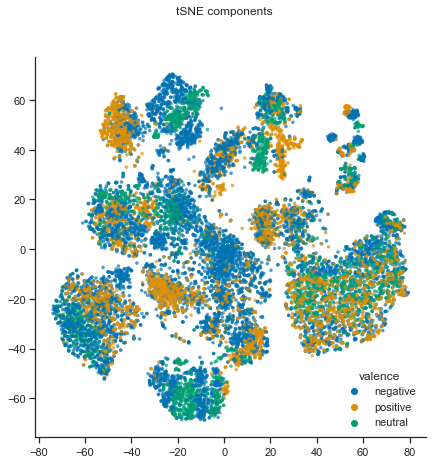

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2461 samples in 0.003s...
[t-SNE] Computed neighbors for 2461 samples in 0.261s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2461
[t-SNE] Computed conditional probabilities for sample 2000 / 2461
[t-SNE] Computed conditional probabilities for sample 2461 / 2461
[t-SNE] Mean sigma: 0.018395
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.309845
[t-SNE] KL divergence after 1000 iterations: 1.184915


<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

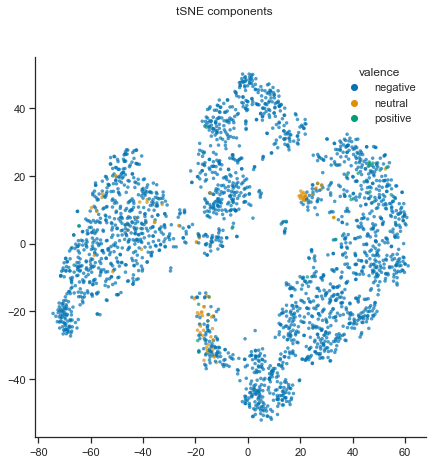

accuracy: 

0.42584315318976024

adjusted balanced accuracy: 

0.04482186246043273

f1: 

0.28784778768257613

geometric mean: 

0.10458741847297122

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 54647.97it/s]


0.5213313696569915

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15132 samples in 0.011s...
[t-SNE] Computed neighbors for 15132 samples in 2.858s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15132
[t-SNE] Computed conditional probabilities for sample 2000 / 15132
[t-SNE] Computed conditional probabilities for sample 3000 / 15132
[t-SNE] Computed conditional probabilities for sample 4000 / 15132
[t-SNE] Computed conditional probabilities for sample 5000 / 15132
[t-SNE] Computed conditional probabilities for sample 6000 / 15132
[t-SNE] Computed conditional probabilities for sample 7000 / 15132
[t-SNE] Computed conditional probabilities for sample 8000 / 15132
[t-SNE] Computed conditional probabilities for sample 9000 / 15132
[t-SNE] Computed conditional probabilities for sample 10000 / 15132
[t-SNE] Computed conditional probabilities for sample 11000 / 15132
[t-SNE] Computed conditional probabilities for sample 12000 / 15132
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

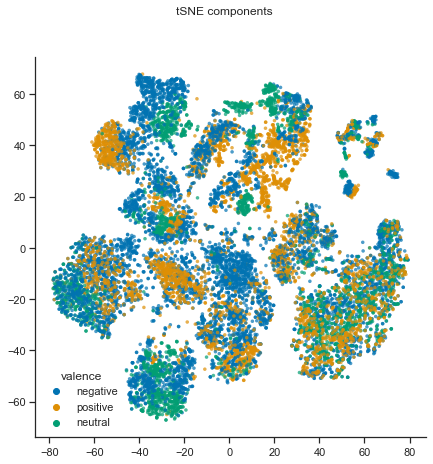

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2571 samples in 0.002s...
[t-SNE] Computed neighbors for 2571 samples in 0.134s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2571
[t-SNE] Computed conditional probabilities for sample 2000 / 2571
[t-SNE] Computed conditional probabilities for sample 2571 / 2571
[t-SNE] Mean sigma: 0.018389
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.998787
[t-SNE] KL divergence after 1000 iterations: 1.490026


<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

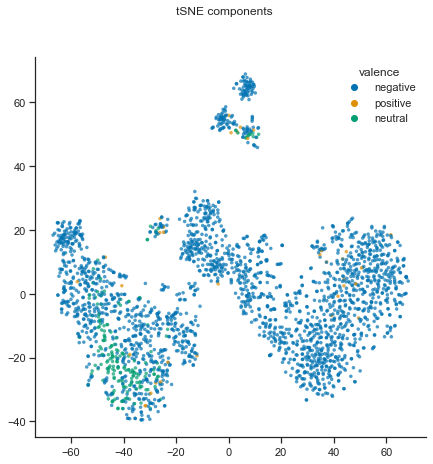

accuracy: 

0.5954881369117075

adjusted balanced accuracy: 

0.050644937230091024

f1: 

0.4925618668597344

geometric mean: 

0.1242583394760485

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 111696.92it/s]


0.5266081971226894

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12102 samples in 0.008s...
[t-SNE] Computed neighbors for 12102 samples in 1.138s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12102
[t-SNE] Computed conditional probabilities for sample 2000 / 12102
[t-SNE] Computed conditional probabilities for sample 3000 / 12102
[t-SNE] Computed conditional probabilities for sample 4000 / 12102
[t-SNE] Computed conditional probabilities for sample 5000 / 12102
[t-SNE] Computed conditional probabilities for sample 6000 / 12102
[t-SNE] Computed conditional probabilities for sample 7000 / 12102
[t-SNE] Computed conditional probabilities for sample 8000 / 12102
[t-SNE] Computed conditional probabilities for sample 9000 / 12102
[t-SNE] Computed conditional probabilities for sample 10000 / 12102
[t-SNE] Computed conditional probabilities for sample 11000 / 12102
[t-SNE] Computed conditional probabilities for sample 12000 / 12102
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

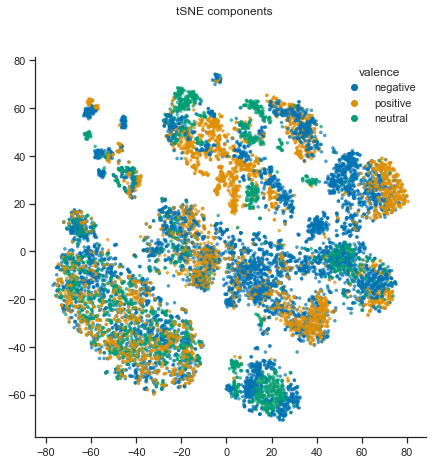

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5601 samples in 0.000s...
[t-SNE] Computed neighbors for 5601 samples in 0.375s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5601
[t-SNE] Computed conditional probabilities for sample 2000 / 5601
[t-SNE] Computed conditional probabilities for sample 3000 / 5601
[t-SNE] Computed conditional probabilities for sample 4000 / 5601
[t-SNE] Computed conditional probabilities for sample 5000 / 5601
[t-SNE] Computed conditional probabilities for sample 5601 / 5601
[t-SNE] Mean sigma: 0.019504
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.645752
[t-SNE] KL divergence after 1000 iterations: 1.809465


<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

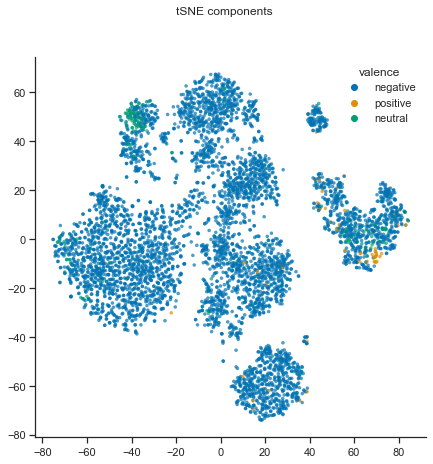

accuracy: 

0.619532226388145

adjusted balanced accuracy: 

0.046513183666347484

f1: 

0.5037153929129059

geometric mean: 

0.12294661470190792

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 119485.57it/s]


0.523653476145779

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13993 samples in 0.016s...
[t-SNE] Computed neighbors for 13993 samples in 1.470s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13993
[t-SNE] Computed conditional probabilities for sample 2000 / 13993
[t-SNE] Computed conditional probabilities for sample 3000 / 13993
[t-SNE] Computed conditional probabilities for sample 4000 / 13993
[t-SNE] Computed conditional probabilities for sample 5000 / 13993
[t-SNE] Computed conditional probabilities for sample 6000 / 13993
[t-SNE] Computed conditional probabilities for sample 7000 / 13993
[t-SNE] Computed conditional probabilities for sample 8000 / 13993
[t-SNE] Computed conditional probabilities for sample 9000 / 13993
[t-SNE] Computed conditional probabilities for sample 10000 / 13993
[t-SNE] Computed conditional probabilities for sample 11000 / 13993
[t-SNE] Computed conditional probabilities for sample 12000 / 13993
[t-SNE] Computed conditional probabilities for sam

<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

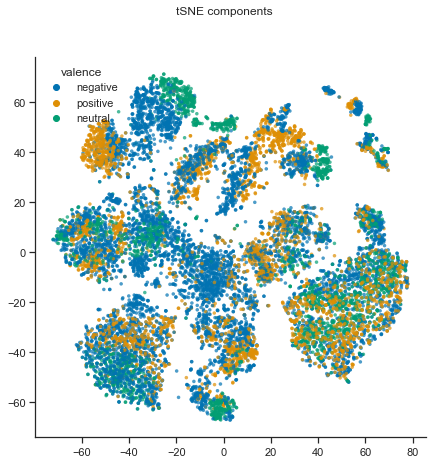

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3710 samples in 0.003s...
[t-SNE] Computed neighbors for 3710 samples in 0.198s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3710
[t-SNE] Computed conditional probabilities for sample 2000 / 3710
[t-SNE] Computed conditional probabilities for sample 3000 / 3710
[t-SNE] Computed conditional probabilities for sample 3710 / 3710
[t-SNE] Mean sigma: 0.018919
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.078049
[t-SNE] KL divergence after 1000 iterations: 1.395800


<AxesSubplot:xlabel='X', ylabel='Y'>

Text(0.5, 0, '')

Text(0, 0.5, '')

Text(0.5, 0.98, 'tSNE components')

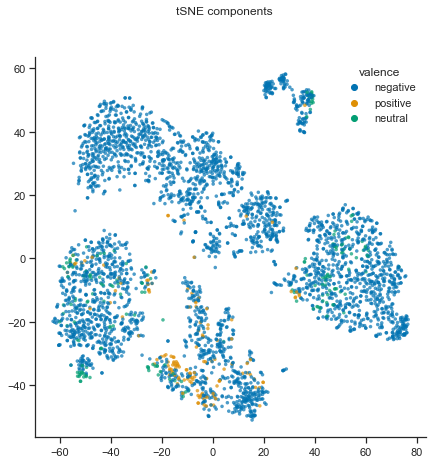

accuracy: 

0.4787061994609164

adjusted balanced accuracy: 

0.05519536444136055

f1: 

0.36329289432738804

geometric mean: 

0.1652204268802019

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 79144.65it/s]


0.5287057749319015

time: 22min 24s


In [15]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    nystroem = Nystroem(random_state=SEED, n_jobs=-1).fit(x_train)
    x_train = nystroem.transform(x_train)
    model = RidgeClassifier(random_state=SEED).fit(
        x_train, y_train := labels.iloc[train_idx].loc[:, "valence"]
    )

    transformed_data = TSNE(
        init="pca", verbose=1, random_state=SEED, n_jobs=-1, square_distances=True
    ).fit_transform(x_train)
    X, Y = transformed_data[:, 0], transformed_data[:, 1]
    df = pd.DataFrame({"X": X, "Y": Y, "hue": y_train.values})
    sns.scatterplot(
        x=df.X,
        y=df.Y,
        hue=df.hue.replace([0, 1, 2], ["negative", "neutral", "positive"]),
        data=df,
        palette="colorblind",
        alpha=0.7,
        legend="brief",
        linewidth=0,
        marker=".",
        s=50,
    )
    fig = plt.gcf()
    fig.set_figwidth(7)
    fig.set_figheight(7)
    sns.despine(**dict.fromkeys(("top", "right"), True))
    plt.legend(title="valence", frameon=False)
    plt.xlabel("")
    plt.ylabel("")
    plt.suptitle("tSNE components")
    plt.show()

    X_test = nystroem.transform(data.iloc[test_idx])
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }

    transformed_data = TSNE(
        init="pca", verbose=1, random_state=SEED, n_jobs=-1, square_distances=True
    ).fit_transform(X_test)
    X, Y = transformed_data[:, 0], transformed_data[:, 1]
    df = pd.DataFrame({"X": X, "Y": Y, "hue": score_params["y_pred"]})
    sns.scatterplot(
        x=df.X,
        y=df.Y,
        hue=df.hue.replace([0, 1, 2], ["negative", "neutral", "positive"]),
        data=df,
        palette="colorblind",
        alpha=0.7,
        legend="brief",
        linewidth=0,
        marker=".",
        s=50,
    )
    fig = plt.gcf()
    fig.set_figwidth(7)
    fig.set_figheight(7)
    sns.despine(**dict.fromkeys(("top", "right"), True))
    plt.legend(title="valence", frameon=False)
    plt.xlabel("")
    plt.ylabel("")
    plt.suptitle("tSNE components")
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [17]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5477829908091535
adjusted balanced accuracy:  0.05576221921431891
f1 0.4281193115297038
geometric mean:  0.11954510014096593
roc_auc:  0.5276542424662795
time: 401 ms


from above for reference
* accuracy:  0.5442113792713357
* adjusted balanced accuracy:  0.06859747163164584
* f1 0.4581272881940137
* geometric mean:  0.20146903965601815
* roc_auc:  0.5357471019921884
* 
* accuracy:  0.5242047917685493
* adjusted balanced accuracy:  0.10259608243130895
* f1 0.47087182046958986
* geometric mean:  0.29176632055018226
* roc_auc:  0.5503626642847146

These features aren't so great for Ridge, but they're better than guessing. Would they improve scores if used alongside the LDA components? What if they were derived from the components instead of the FRILL embeddings?

-- Epoch 1
Norm: 0.60, NNZs: 2, Bias: 0.348081, T: 7655, Avg. loss: 0.266442
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.58, NNZs: 2, Bias: 0.357697, T: 15310, Avg. loss: 0.246057
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.57, NNZs: 2, Bias: 0.362870, T: 22965, Avg. loss: 0.242057
Total training time: 0.00 seconds.
-- Epoch 4
Norm: 0.57, NNZs: 2, Bias: 0.368048, T: 30620, Avg. loss: 0.240830
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.56, NNZs: 2, Bias: 0.371181, T: 38275, Avg. loss: 0.239978
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.56, NNZs: 2, Bias: 0.374472, T: 45930, Avg. loss: 0.238553
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.56, NNZs: 2, Bias: 0.375561, T: 53585, Avg. loss: 0.236832
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.56, NNZs: 2, Bias: 0.376389, T: 61240, Avg. loss: 0.236218
Total training time: 0.02 seconds.
-- Epoch 9
Norm: 0.56, NNZs: 2, Bias: 0.378467, T: 68895, Avg. loss: 0.236441
Total training time

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


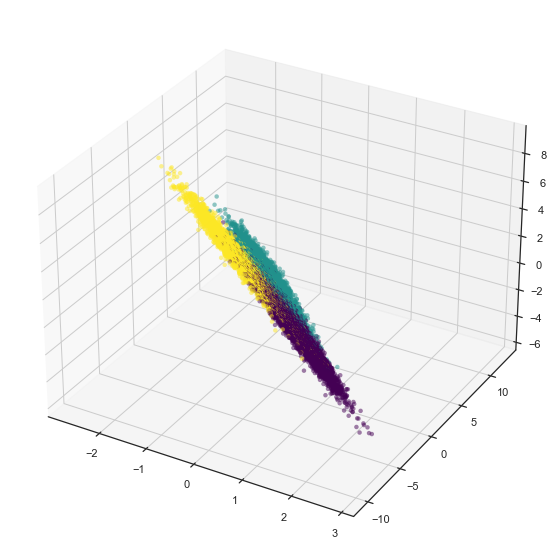

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


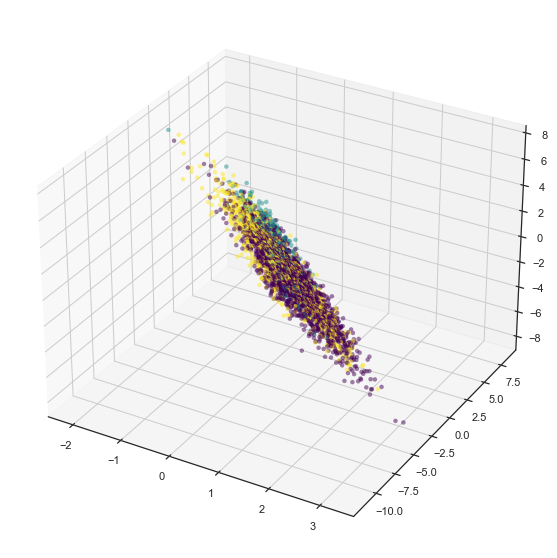

accuracy: 

0.6401785714285714

adjusted balanced accuracy: 

0.28586336537181717

f1: 

0.6005396959780803

geometric mean: 

0.4486069120671146

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 68522.72it/s]


0.6367292123873745

-- Epoch 1
Norm: 0.42, NNZs: 2, Bias: 0.581060, T: 8708, Avg. loss: 0.193997
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.41, NNZs: 2, Bias: 0.595910, T: 17416, Avg. loss: 0.171455
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 0.40, NNZs: 2, Bias: 0.599632, T: 26124, Avg. loss: 0.164619
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 0.39, NNZs: 2, Bias: 0.604725, T: 34832, Avg. loss: 0.162272
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.39, NNZs: 2, Bias: 0.608073, T: 43540, Avg. loss: 0.161665
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.39, NNZs: 2, Bias: 0.608825, T: 52248, Avg. loss: 0.159080
Total training time: 0.02 seconds.
-- Epoch 7
Norm: 0.39, NNZs: 2, Bias: 0.611216, T: 60956, Avg. loss: 0.159204
Total training time: 0.02 seconds.
-- Epoch 8
Norm: 0.39, NNZs: 2, Bias: 0.613113, T: 69664, Avg. loss: 0.158250
Total training time: 0.02 seconds.
-- Epoch 9
Norm: 0.38, NNZs: 2, Bias: 0.614062, T: 78372, Avg. loss: 0.157185
Total training time

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


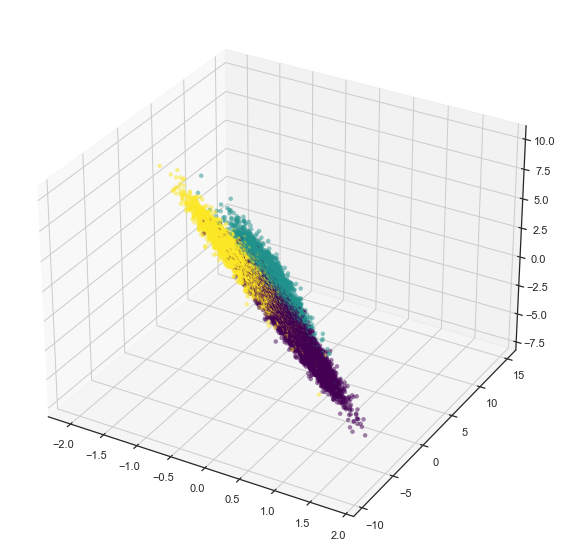

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


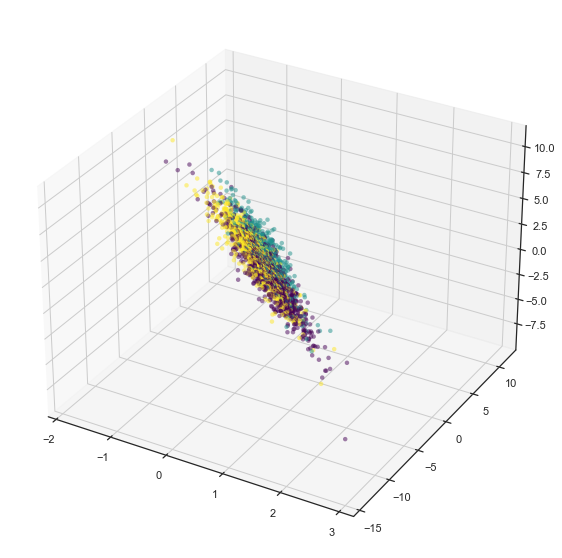

accuracy: 

0.5457131247460382

adjusted balanced accuracy: 

0.28393685578374633

f1: 

0.5289304752168592

geometric mean: 

0.4916552057971458

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 66463.94it/s]


0.6402741302083003

-- Epoch 1
Norm: 0.52, NNZs: 2, Bias: 0.447356, T: 8154, Avg. loss: 0.198522
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.52, NNZs: 2, Bias: 0.432842, T: 16308, Avg. loss: 0.209928
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.53, NNZs: 2, Bias: 0.431094, T: 24462, Avg. loss: 0.213834
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 0.53, NNZs: 2, Bias: 0.429708, T: 32616, Avg. loss: 0.214956
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.53, NNZs: 2, Bias: 0.428572, T: 40770, Avg. loss: 0.215031
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.53, NNZs: 2, Bias: 0.426027, T: 48924, Avg. loss: 0.214606
Total training time: 0.01 seconds.
Convergence after 6 epochs took 0.01 seconds
-- Epoch 1
Norm: 2.14, NNZs: 2, Bias: -3.790133, T: 3114, Avg. loss: 0.660817
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.20, NNZs: 2, Bias: -4.041239, T: 6228, Avg. loss: 0.766235
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 2.26, NNZs: 2, Bias: -4.171623, T: 

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


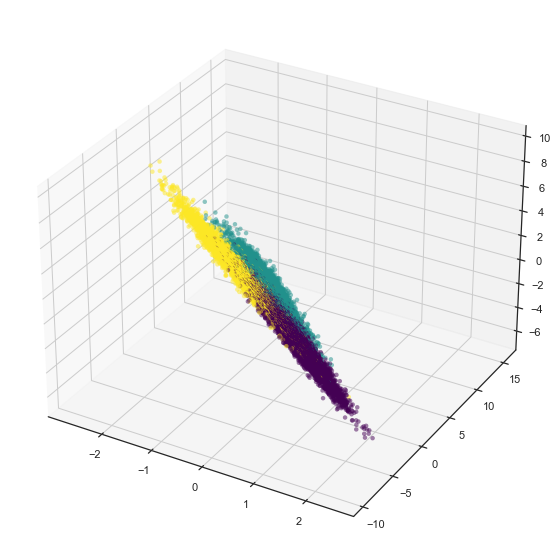

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


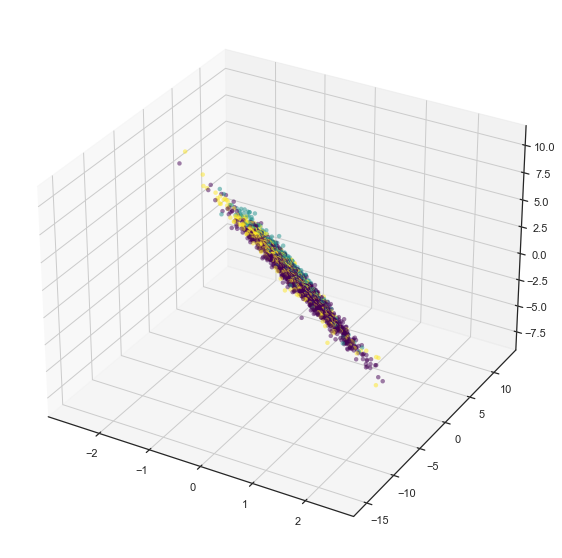

accuracy: 

0.5888759237650719

adjusted balanced accuracy: 

0.2638996651164824

f1: 

0.5891917268684582

geometric mean: 

0.4907935691462645

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 35194.49it/s]


0.6320858672114523

-- Epoch 1
Norm: 0.60, NNZs: 2, Bias: 0.365177, T: 6297, Avg. loss: 0.257520
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.57, NNZs: 2, Bias: 0.371188, T: 12594, Avg. loss: 0.237665
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 0.57, NNZs: 2, Bias: 0.376457, T: 18891, Avg. loss: 0.235026
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 0.57, NNZs: 2, Bias: 0.381658, T: 25188, Avg. loss: 0.233285
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.56, NNZs: 2, Bias: 0.385071, T: 31485, Avg. loss: 0.231123
Total training time: 0.01 seconds.
-- Epoch 6
Norm: 0.56, NNZs: 2, Bias: 0.386716, T: 37782, Avg. loss: 0.230514
Total training time: 0.01 seconds.
-- Epoch 7
Norm: 0.56, NNZs: 2, Bias: 0.388989, T: 44079, Avg. loss: 0.230106
Total training time: 0.01 seconds.
-- Epoch 8
Norm: 0.56, NNZs: 2, Bias: 0.389944, T: 50376, Avg. loss: 0.228213
Total training time: 0.01 seconds.
-- Epoch 9
Norm: 0.56, NNZs: 2, Bias: 0.391494, T: 56673, Avg. loss: 0.229221
Total training time

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


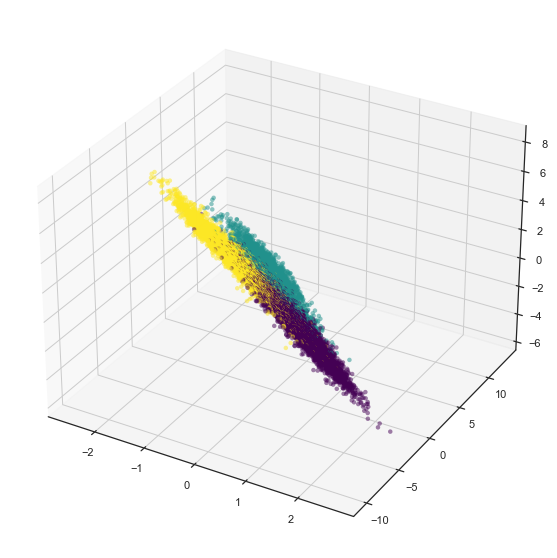

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


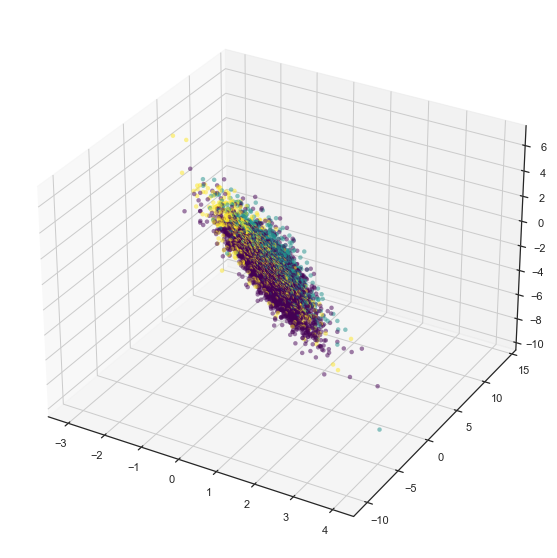

accuracy: 

0.6150687377254062

adjusted balanced accuracy: 

0.24684667086984188

f1: 

0.6012194741665026

geometric mean: 

0.446408900589052

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 76666.23it/s]


0.6251811788275241

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


-- Epoch 1
Norm: 0.45, NNZs: 2, Bias: 0.548909, T: 8010, Avg. loss: 0.205755
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 0.43, NNZs: 2, Bias: 0.555250, T: 16020, Avg. loss: 0.181347
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 0.43, NNZs: 2, Bias: 0.562925, T: 24030, Avg. loss: 0.178171
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 0.42, NNZs: 2, Bias: 0.568016, T: 32040, Avg. loss: 0.175598
Total training time: 0.01 seconds.
-- Epoch 5
Norm: 0.42, NNZs: 2, Bias: 0.569892, T: 40050, Avg. loss: 0.173784
Total training time: 0.02 seconds.
-- Epoch 6
Norm: 0.42, NNZs: 2, Bias: 0.572407, T: 48060, Avg. loss: 0.172931
Total training time: 0.02 seconds.
-- Epoch 7
Norm: 0.42, NNZs: 2, Bias: 0.574652, T: 56070, Avg. loss: 0.172427
Total training time: 0.02 seconds.
-- Epoch 8
Norm: 0.41, NNZs: 2, Bias: 0.574863, T: 64080, Avg. loss: 0.171261
Total training time: 0.03 seconds.
-- Epoch 9
Norm: 0.41, NNZs: 2, Bias: 0.576303, T: 72090, Avg. loss: 0.171320
Total training time

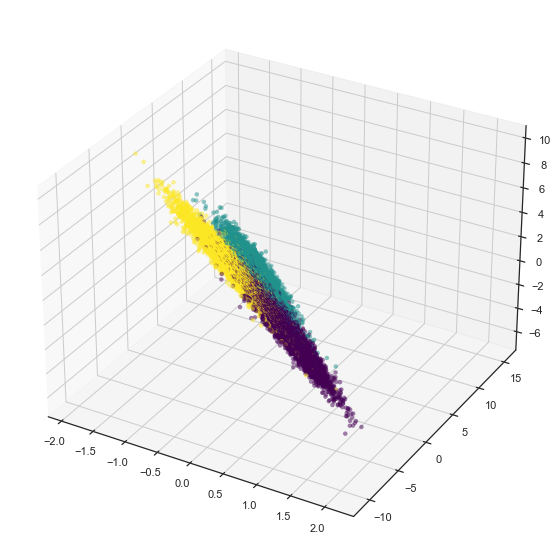

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2417487025.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


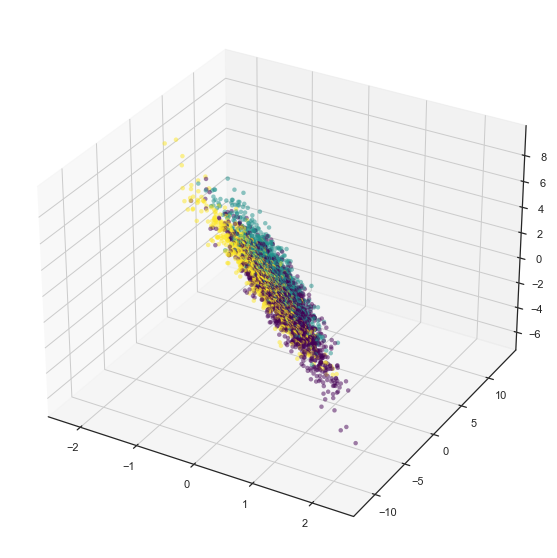

accuracy: 

0.5700808625336927

adjusted balanced accuracy: 

0.3093088678322385

f1: 

0.5640614914506921

geometric mean: 

0.528033791132167

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 137222.27it/s]


0.6533088224158945

time: 3min


In [21]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    y_train = labels.iloc[train_idx].loc[:, "valence"]
    lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
    components = lda.transform(x_train)
    x_train["LDA1"] = components[:, 0]
    x_train["LDA2"] = components[:, 1]
    x_train = x_train[["LDA1", "LDA2"]]
    neg_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        x_train.loc[labels.valence == 0]
    )
    neu_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        x_train.loc[labels.valence == 1]
    )
    pos_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(
        x_train.loc[labels.valence == 2]
    )
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train,
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    components = lda.transform(X_test)
    X_test["LDA1"] = components[:, 0]
    X_test["LDA2"] = components[:, 1]
    X_test = X_test[["LDA1", "LDA2"]]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [22]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5919834440397561
adjusted balanced accuracy:  0.27797108499482526
f1 0.5767885727361184
geometric mean:  0.48109967574634876
roc_auc:  0.637515842210109
time: 874 ms


Hey, that's the best yet in this notebook! We must try again w/o SGD.

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


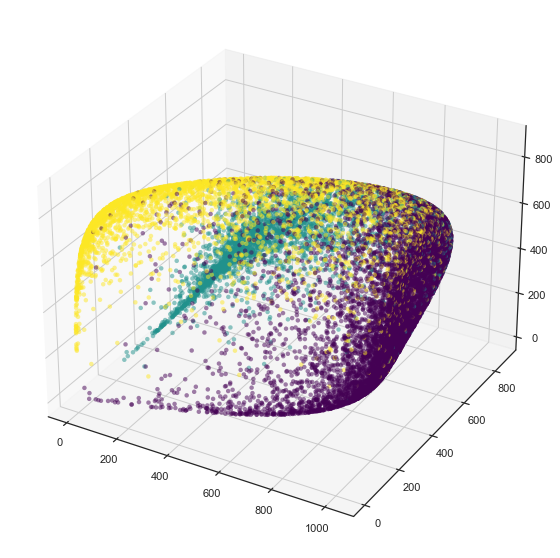

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


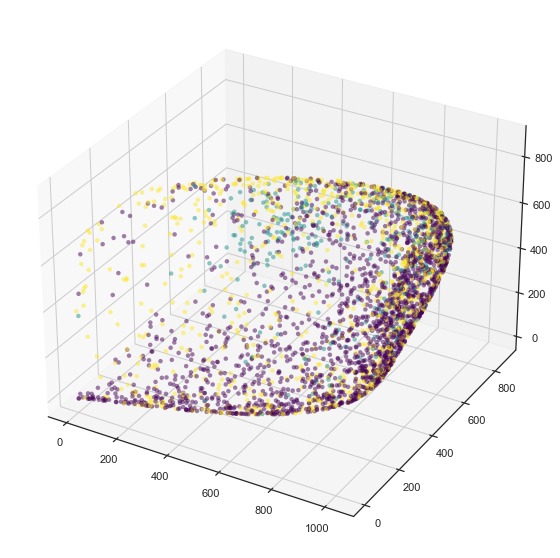

accuracy: 

0.6279761904761905

adjusted balanced accuracy: 

0.27279295504530504

f1: 

0.5917554523114763

geometric mean: 

0.4444584424870343

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 129161.96it/s]


0.629229611735836

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


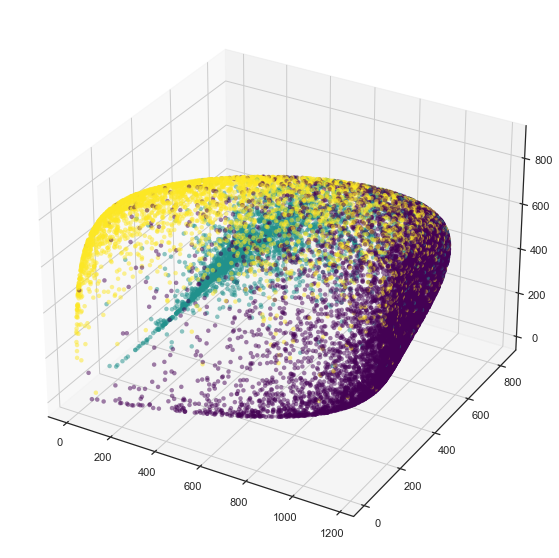

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


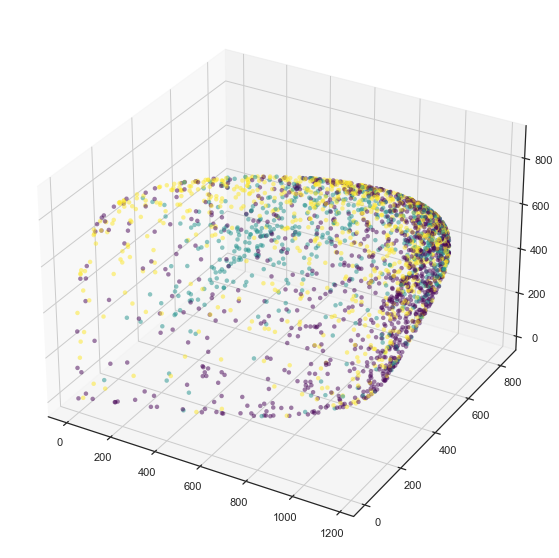

accuracy: 

0.543681430312881

adjusted balanced accuracy: 

0.28512157442080116

f1: 

0.526442041614644

geometric mean: 

0.4913062681211053

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 52328.07it/s]


0.6403130691429598

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


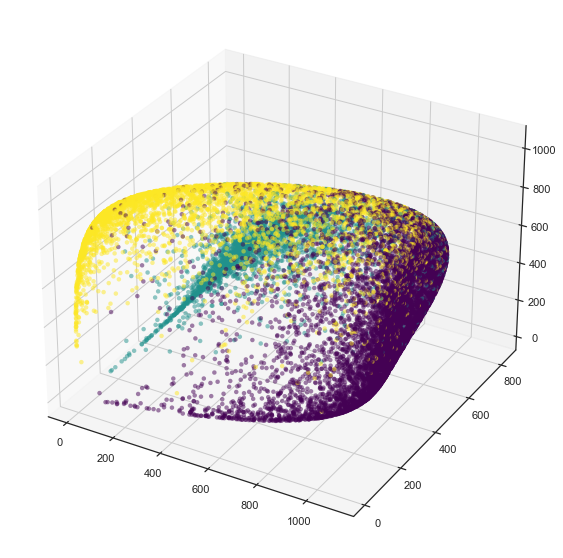

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


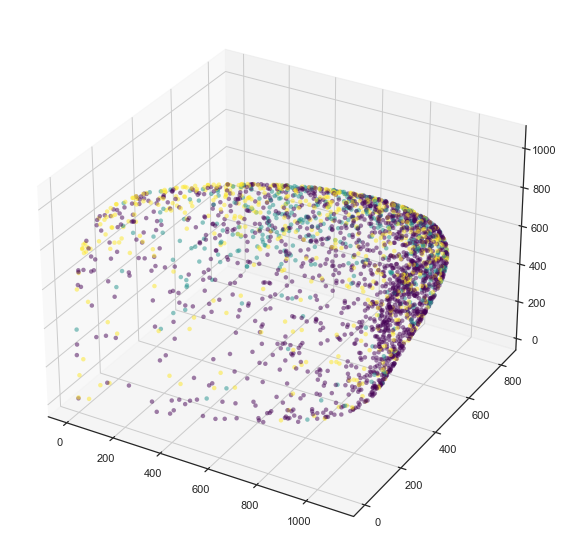

accuracy: 

0.5884869700505639

adjusted balanced accuracy: 

0.26143174647969447

f1: 

0.587877388563421

geometric mean: 

0.4878255207829718

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 39525.54it/s]


0.6304644795372202

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


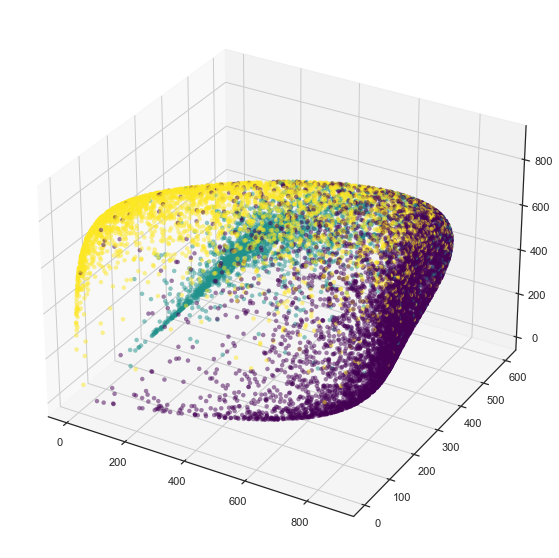

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


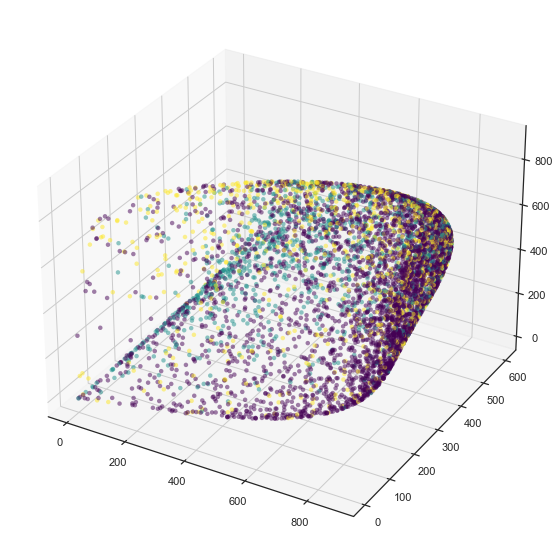

accuracy: 

0.6159614354579539

adjusted balanced accuracy: 

0.26360379812753915

f1: 

0.6022593740006412

geometric mean: 

0.4452499574377475

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 26909.02it/s]


0.6338990351704236

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


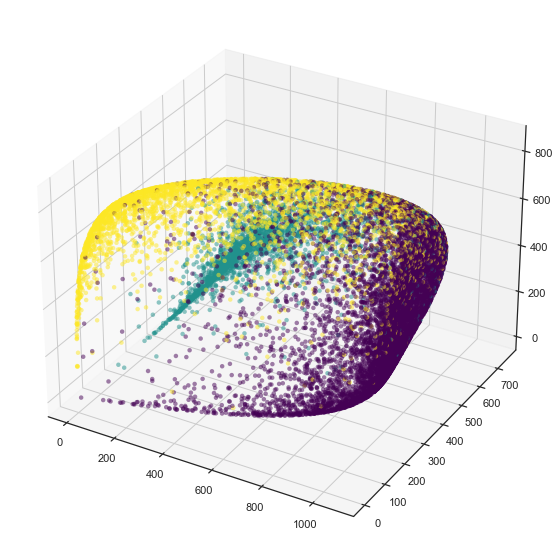

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/3700534601.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


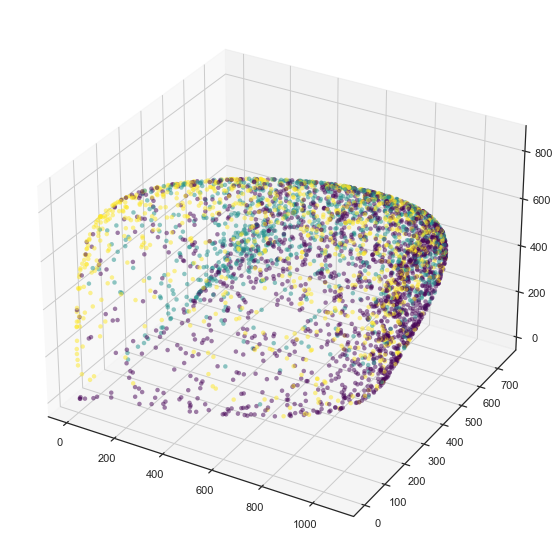

accuracy: 

0.5665768194070081

adjusted balanced accuracy: 

0.31078023226245344

f1: 

0.5620536085520386

geometric mean: 

0.5318373719724334

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 84261.28it/s]


0.6529522139452782

time: 5min 1s


In [24]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    y_train = labels.iloc[train_idx].loc[:, "valence"]
    lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
    components = lda.transform(x_train)
    x_train["LDA1"] = components[:, 0]
    x_train["LDA2"] = components[:, 1]
    x_train = x_train.loc[:, ["LDA1", "LDA2"]]
    neg_classifier = OneClassSVM().fit(x_train.loc[labels.valence == 0])
    neu_classifier = OneClassSVM().fit(x_train.loc[labels.valence == 1])
    pos_classifier = OneClassSVM().fit(x_train.loc[labels.valence == 2])
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train,
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    components = lda.transform(X_test)
    X_test["LDA1"] = components[:, 0]
    X_test["LDA2"] = components[:, 1]
    X_test = X_test.loc[:, ["LDA1", "LDA2"]]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [25]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5885365691409195
adjusted balanced accuracy:  0.2787460612671587
f1 0.5740775730084442
geometric mean:  0.4801355121602585
roc_auc:  0.6373716819063435
time: 2.13 s


from above for reference
* accuracy:  0.5919834440397561
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

Accuracy was slightly better with the SGD method. The other scores were a little closer. Let's try some other kernels.

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


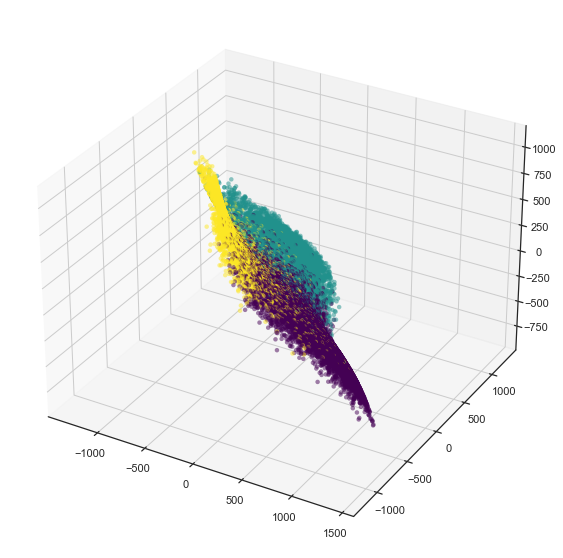

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


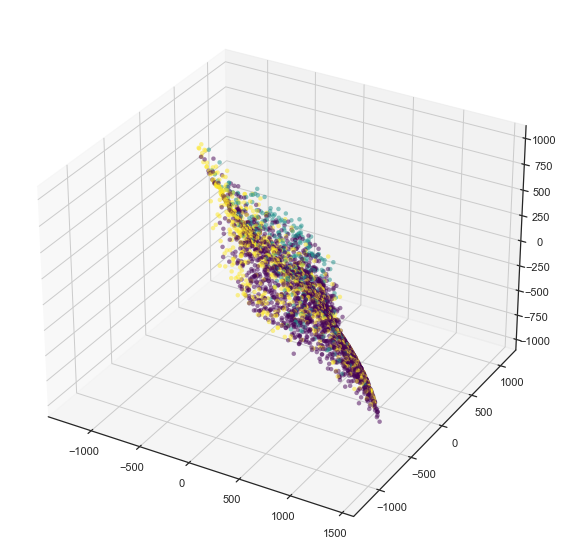

accuracy: 

0.6324404761904762

adjusted balanced accuracy: 

0.2908697596664724

f1: 

0.5958110749161291

geometric mean: 

0.45321404535479876

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 39041.64it/s]


0.6388712257340691

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


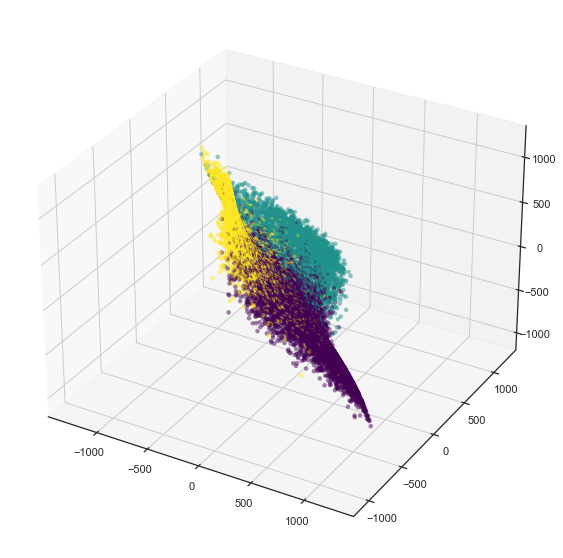

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


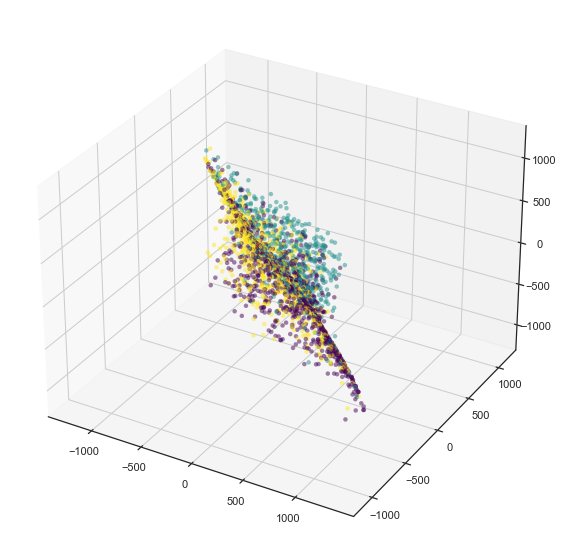

accuracy: 

0.5534335635920358

adjusted balanced accuracy: 

0.2960435950965961

f1: 

0.5383383442332987

geometric mean: 

0.5024309589690652

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 55891.05it/s]


0.6463288238614158

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


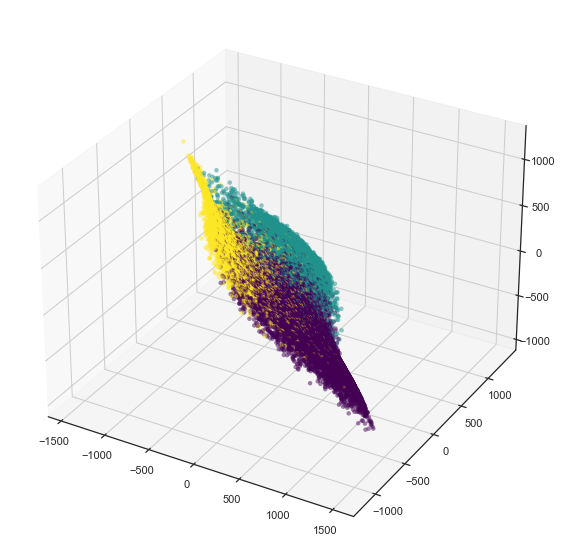

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


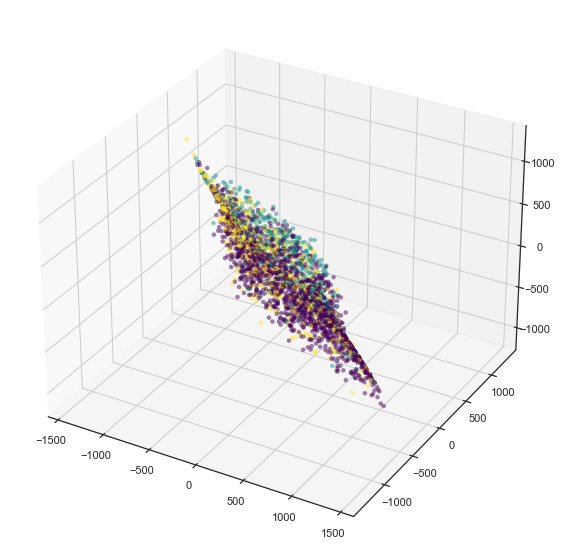

accuracy: 

0.5869311551925321

adjusted balanced accuracy: 

0.2810610839520709

f1: 

0.5906818953500771

geometric mean: 

0.5058394836272836

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 80288.55it/s]


0.640792246263807

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


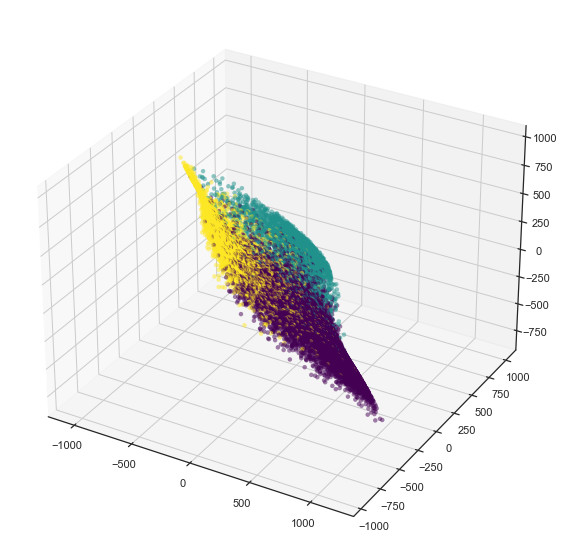

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


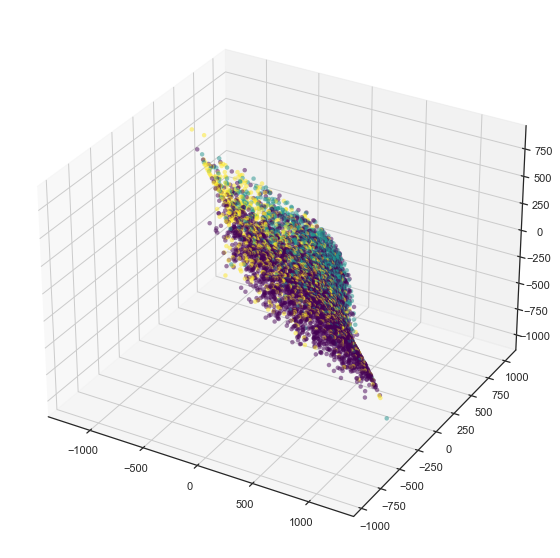

accuracy: 

0.6097125513301196

adjusted balanced accuracy: 

0.25818312418125666

f1: 

0.6014610074596158

geometric mean: 

0.4626582130414042

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 96499.80it/s]


0.6316465077095641

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


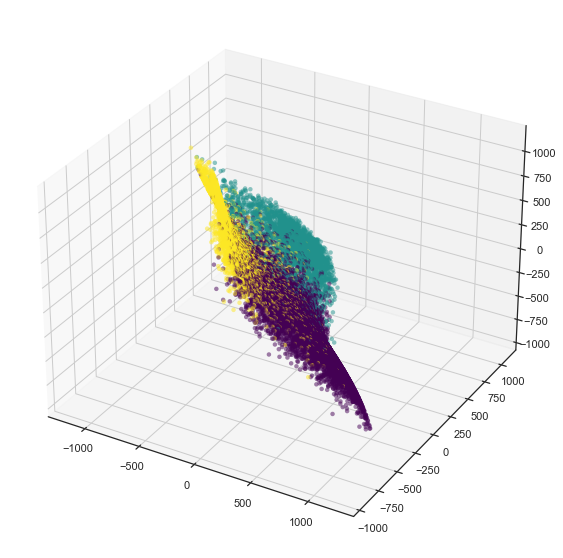

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/1958485186.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


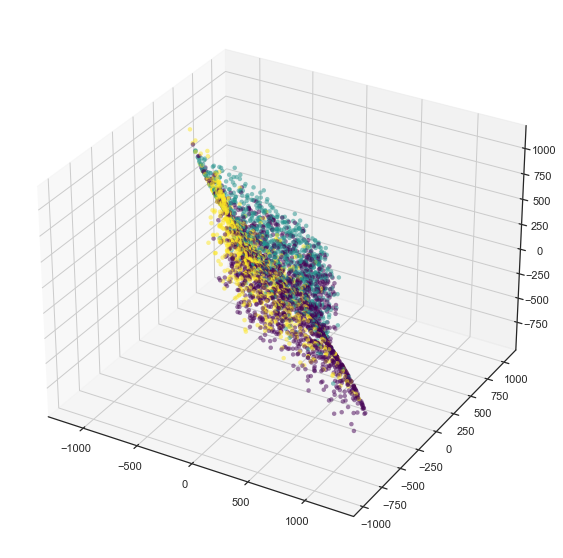

accuracy: 

0.5679245283018868

adjusted balanced accuracy: 

0.3067269608764175

f1: 

0.5623978632073888

geometric mean: 

0.5265886780816704

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 65041.02it/s]


0.6521754532106699

time: 4min 38s


In [26]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    y_train = labels.iloc[train_idx].loc[:, "valence"]
    lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
    components = lda.transform(x_train)
    x_train["LDA1"] = components[:, 0]
    x_train["LDA2"] = components[:, 1]
    x_train = x_train.loc[:, ["LDA1", "LDA2"]]
    neg_classifier = OneClassSVM(kernel="sigmoid").fit(x_train.loc[labels.valence == 0])
    neu_classifier = OneClassSVM(kernel="sigmoid").fit(x_train.loc[labels.valence == 1])
    pos_classifier = OneClassSVM(kernel="sigmoid").fit(x_train.loc[labels.valence == 2])
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train,
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    components = lda.transform(X_test)
    X_test["LDA1"] = components[:, 0]
    X_test["LDA2"] = components[:, 1]
    X_test = X_test.loc[:, ["LDA1", "LDA2"]]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [27]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.59008845492141
adjusted balanced accuracy:  0.2865769047545627
f1 0.5777380370333021
geometric mean:  0.4901462758148444
roc_auc:  0.6419628513559051
time: 458 ms


SGD on LDA
* accuracy:  0.5919834440397561
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

rbf on LDA
* accuracy:  0.5885365691409195
* adjusted balanced accuracy:  0.2787460612671587
* f1 0.5740775730084442
* geometric mean:  0.4801355121602585
* roc_auc:  0.6373716819063435

sigmoid on LDA
* accuracy:  0.59008845492141
* adjusted balanced accuracy:  0.2865769047545627
* f1 0.5777380370333021
* geometric mean:  0.4901462758148444
* roc_auc:  0.6419628513559051

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


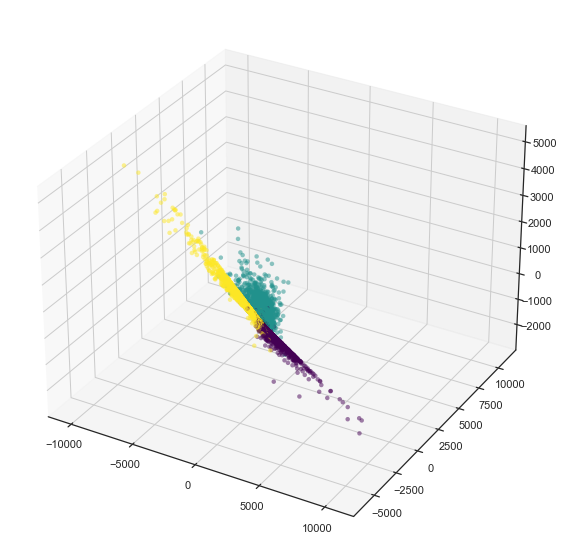

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


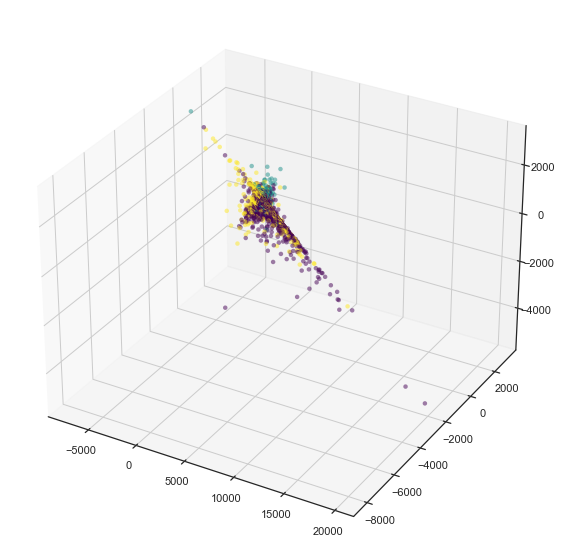

accuracy: 

0.624702380952381

adjusted balanced accuracy: 

0.06254973474261287

f1: 

0.5057565623628892

geometric mean: 

0.1576718537504073

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 197500.72it/s]


0.5303448688244019

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


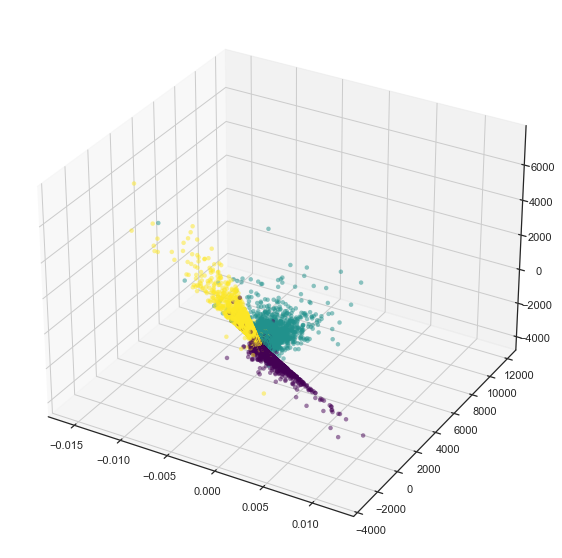

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


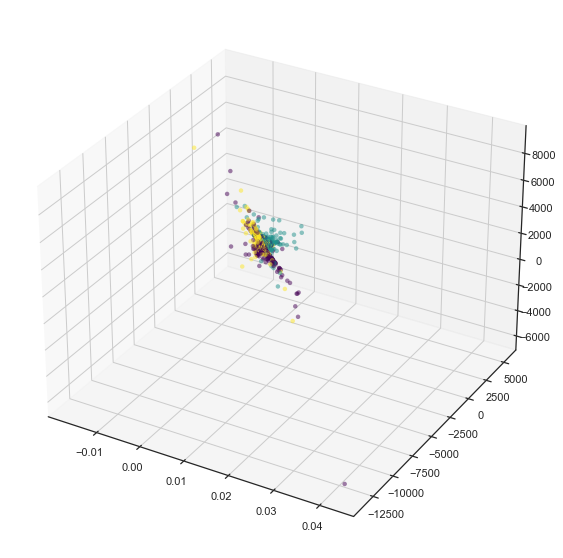

accuracy: 

0.452661519707436

adjusted balanced accuracy: 

0.0915125364353314

f1: 

0.3510857436883182

geometric mean: 

0.22560896374757838

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 122962.17it/s]


0.5447133538578282

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


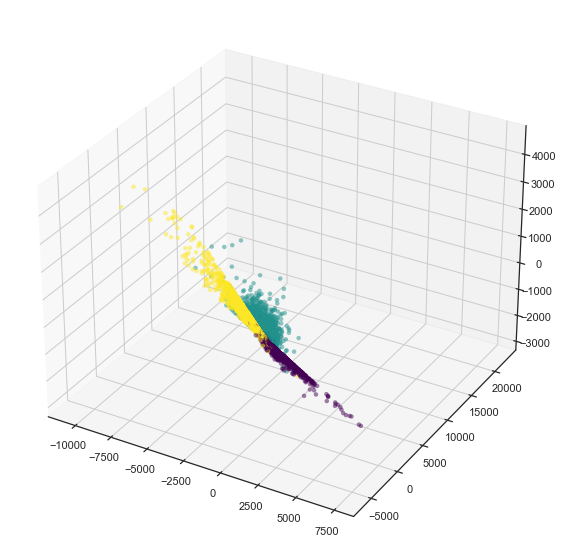

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


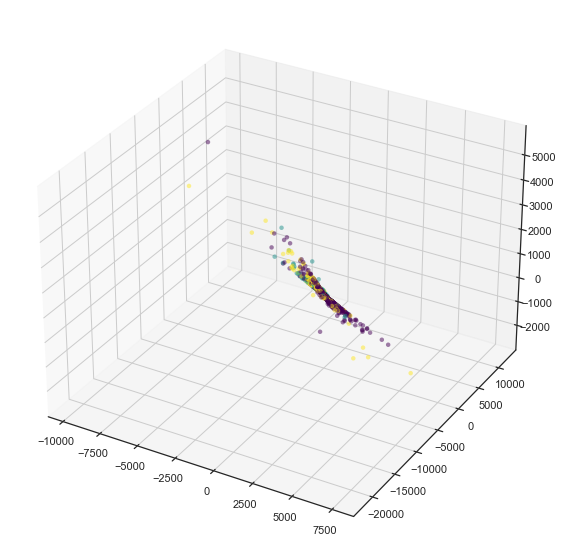

accuracy: 

0.6164916374951381

adjusted balanced accuracy: 

0.08030715065992823

f1: 

0.5249266521193295

geometric mean: 

0.21752685337837493

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 151123.32it/s]


0.5405588945024785

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


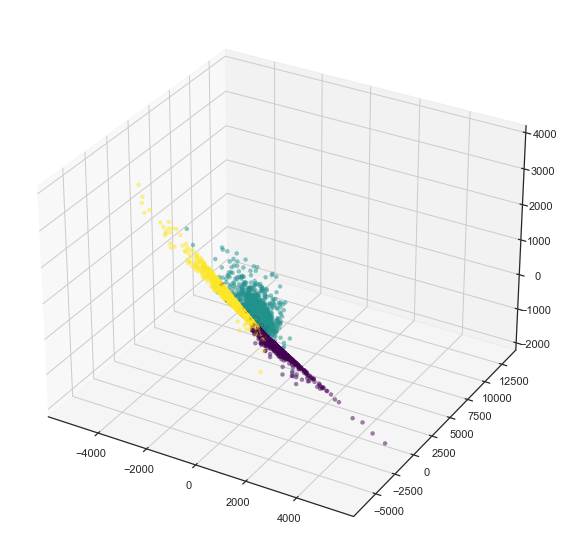

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


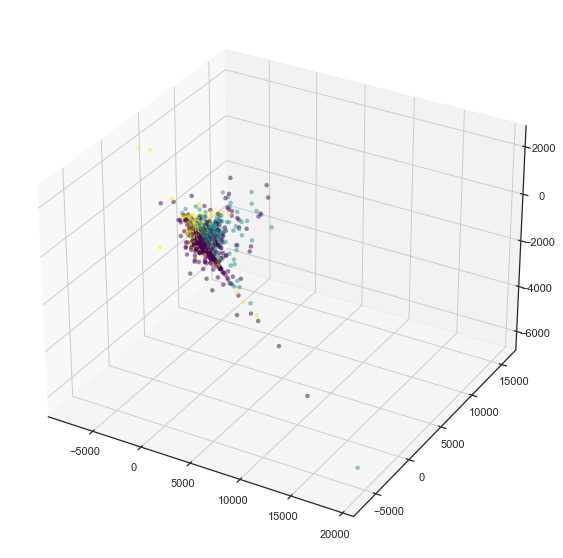

accuracy: 

0.625066952329941

adjusted balanced accuracy: 

0.08920720887459967

f1: 

0.5357613629651126

geometric mean: 

0.2115451708056759

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 91753.88it/s]


0.545052723455163

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


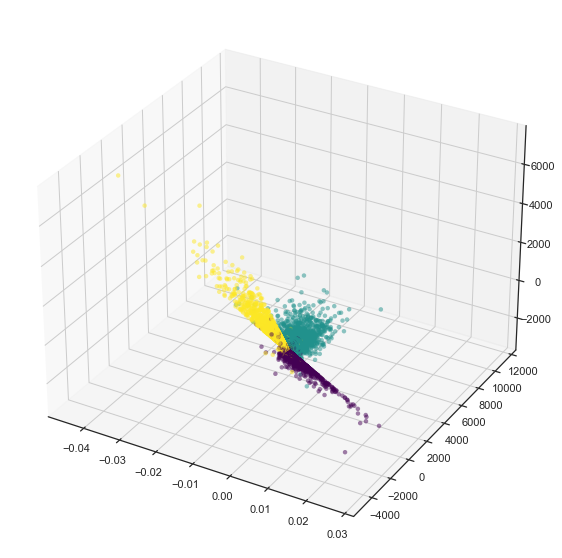

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/2488873454.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


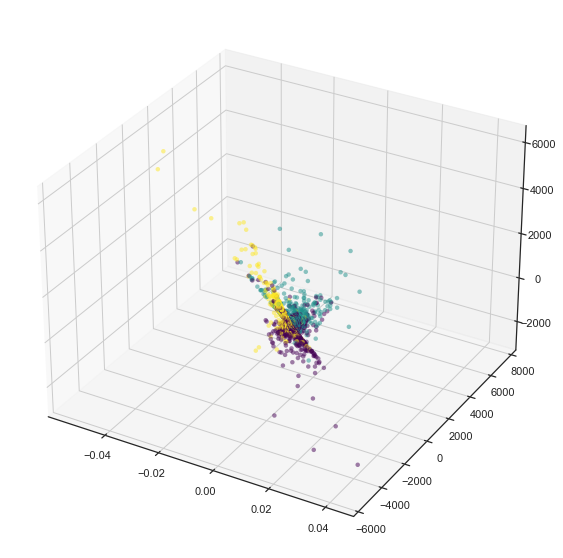

accuracy: 

0.5164420485175202

adjusted balanced accuracy: 

0.13045918343684956

f1: 

0.43684431041738003

geometric mean: 

0.289752579813592

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 62836.14it/s]


0.5649837849516054

time: 3min 50s


In [28]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    y_train = labels.iloc[train_idx].loc[:, "valence"]
    lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
    components = lda.transform(x_train)
    x_train["LDA1"] = components[:, 0]
    x_train["LDA2"] = components[:, 1]
    x_train = x_train.loc[:, ["LDA1", "LDA2"]]
    neg_classifier = OneClassSVM(kernel="poly").fit(x_train.loc[labels.valence == 0])
    neu_classifier = OneClassSVM(kernel="poly").fit(x_train.loc[labels.valence == 1])
    pos_classifier = OneClassSVM(kernel="poly").fit(x_train.loc[labels.valence == 2])
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train,
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    components = lda.transform(X_test)
    X_test["LDA1"] = components[:, 0]
    X_test["LDA2"] = components[:, 1]
    X_test = X_test.loc[:, ["LDA1", "LDA2"]]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [29]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5670729078004833
adjusted balanced accuracy:  0.09080716282986434
f1 0.4708749263106059
geometric mean:  0.2204210842991257
roc_auc:  0.5451307251182953
time: 538 ms


SGD on LDA
* **accuracy:  0.5919834440397561**
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

rbf on LDA
* accuracy:  0.5885365691409195
* adjusted balanced accuracy:  0.2787460612671587
* f1 0.5740775730084442
* geometric mean:  0.4801355121602585
* roc_auc:  0.6373716819063435

sigmoid on LDA
* accuracy:  0.59008845492141
* **adjusted balanced accuracy:  0.2865769047545627**
* **f1:  0.5777380370333021**
* **geometric mean:  0.4901462758148444**
* **roc_auc:  0.6419628513559051**

poly on LDA
* accuracy:  0.5670729078004833
* adjusted balanced accuracy:  0.09080716282986434
* f1 0.4708749263106059
* geometric mean:  0.2204210842991257
* roc_auc:  0.5451307251182953

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


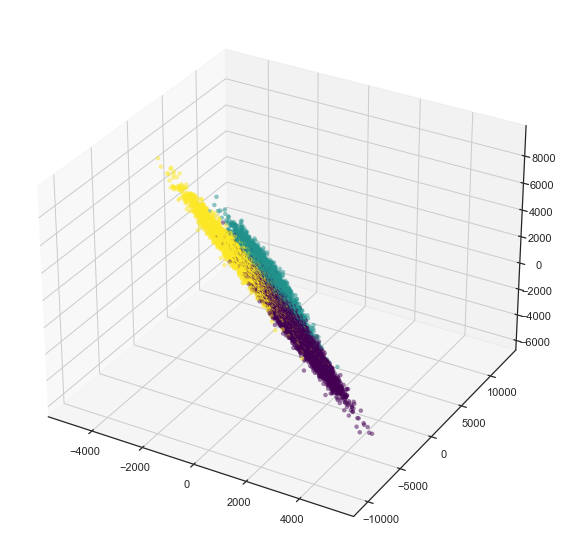

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


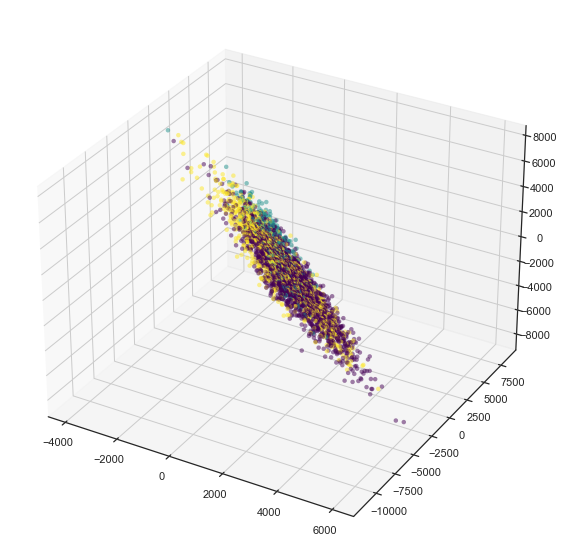

accuracy: 

0.6401785714285714

adjusted balanced accuracy: 

0.28586336537181717

f1: 

0.6005396959780803

geometric mean: 

0.4486069120671146

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 43046.89it/s]


0.6367292123873745

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


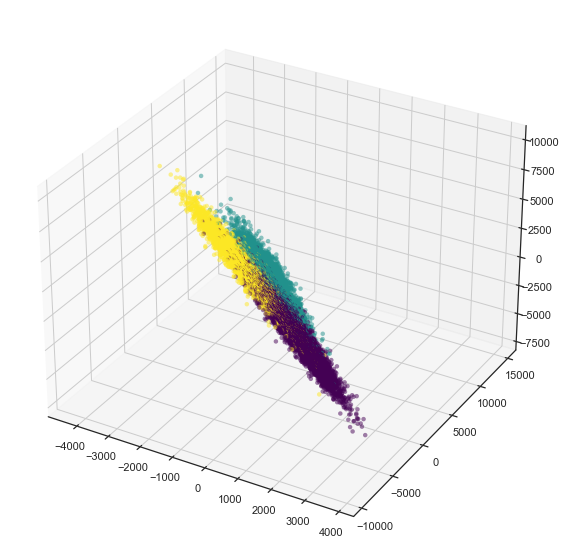

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


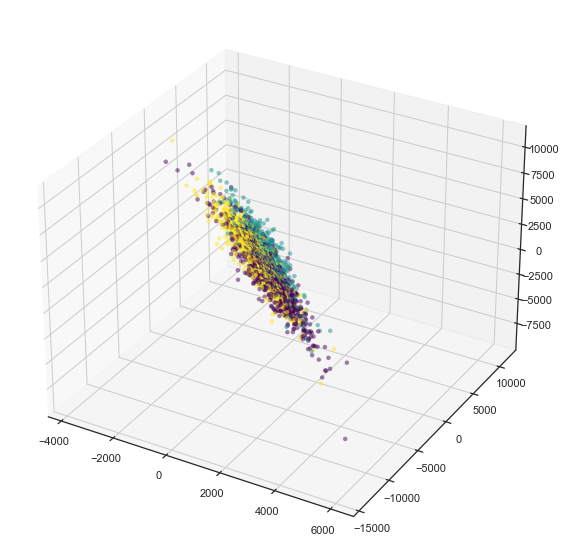

accuracy: 

0.5457131247460382

adjusted balanced accuracy: 

0.28393685578374633

f1: 

0.5289304752168592

geometric mean: 

0.4916552057971458

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 102443.25it/s]


0.6402741302083003

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


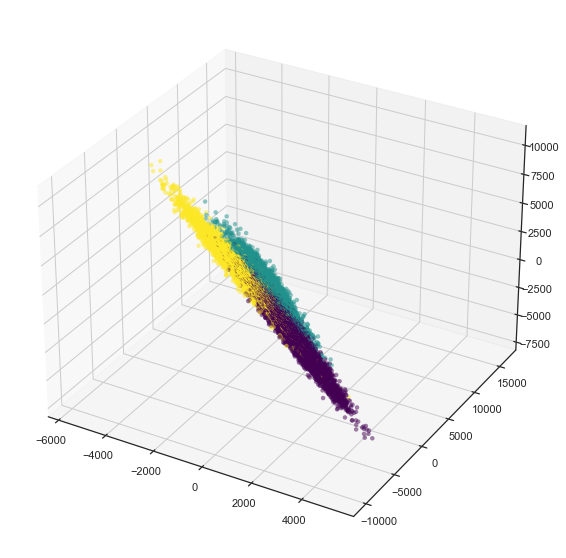

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


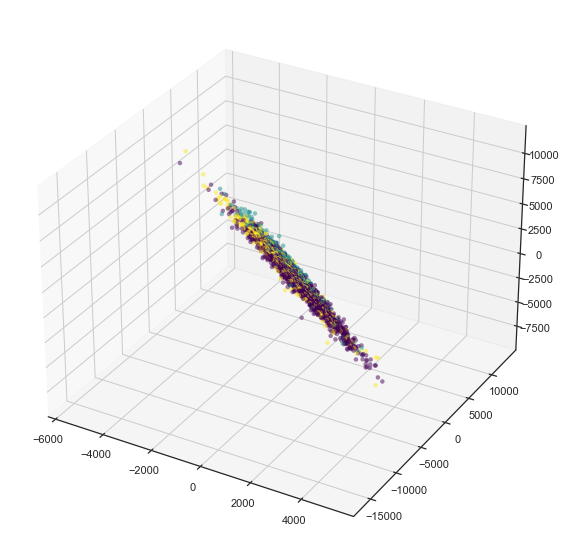

accuracy: 

0.5888759237650719

adjusted balanced accuracy: 

0.2638996651164824

f1: 

0.5891917268684582

geometric mean: 

0.4907935691462645

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 171270.86it/s]


0.6320858672114523

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


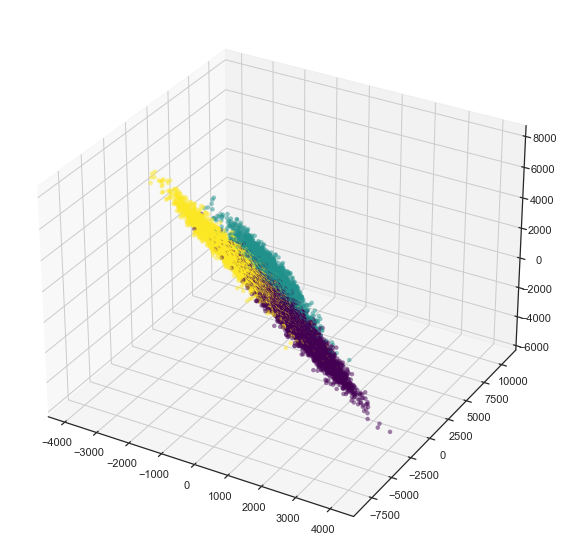

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


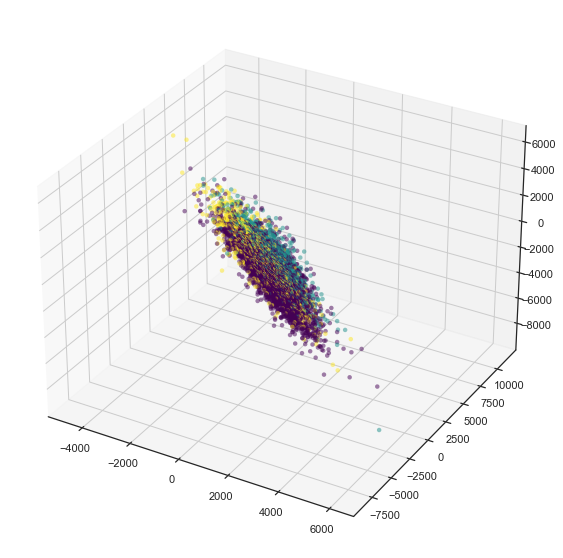

accuracy: 

0.6150687377254062

adjusted balanced accuracy: 

0.24684667086984188

f1: 

0.6012194741665026

geometric mean: 

0.446408900589052

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 164621.40it/s]


0.6251811788275241

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train["LDA2"] = components[:, 1]


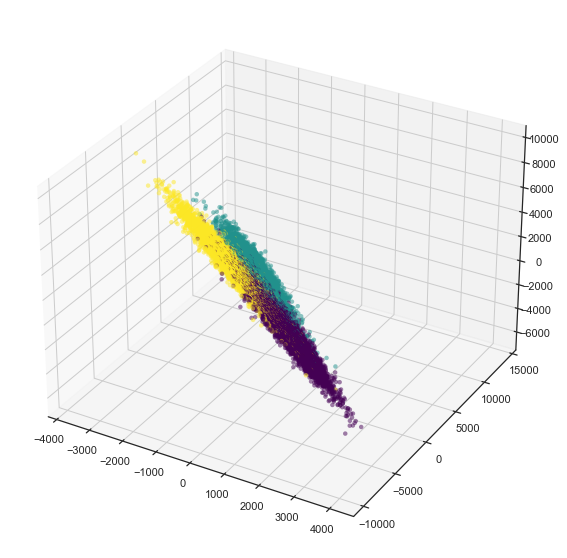

C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA1"] = components[:, 0]
C:\Users\michen\AppData\Local\Temp/ipykernel_229792/41680474.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test["LDA2"] = components[:, 1]


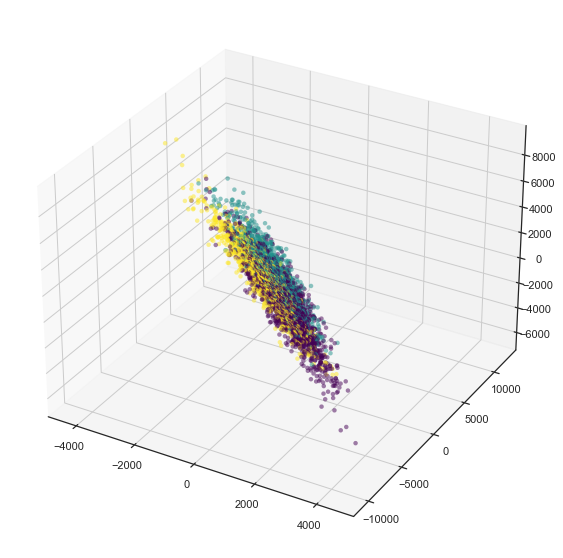

accuracy: 

0.5700808625336927

adjusted balanced accuracy: 

0.3093088678322385

f1: 

0.5640614914506921

geometric mean: 

0.528033791132167

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 112346.35it/s]


0.6533088224158945

time: 3min 51s


In [30]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    y_train = labels.iloc[train_idx].loc[:, "valence"]
    lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
    components = lda.transform(x_train)
    x_train["LDA1"] = components[:, 0]
    x_train["LDA2"] = components[:, 1]
    x_train = x_train.loc[:, ["LDA1", "LDA2"]]
    neg_classifier = OneClassSVM(kernel="linear").fit(x_train.loc[labels.valence == 0])
    neu_classifier = OneClassSVM(kernel="linear").fit(x_train.loc[labels.valence == 1])
    pos_classifier = OneClassSVM(kernel="linear").fit(x_train.loc[labels.valence == 2])
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train),
                "oc_neu": neu_classifier.score_samples(x_train),
                "oc_pos": pos_classifier.score_samples(x_train),
            }
        ),
        y_train,
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    components = lda.transform(X_test)
    X_test["LDA1"] = components[:, 0]
    X_test["LDA2"] = components[:, 1]
    X_test = X_test.loc[:, ["LDA1", "LDA2"]]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test),
            "oc_neu": neu_classifier.score_samples(X_test),
            "oc_pos": pos_classifier.score_samples(X_test),
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()

    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [31]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.5919834440397561
adjusted balanced accuracy:  0.27797108499482526
f1 0.5767885727361184
geometric mean:  0.48109967574634876
roc_auc:  0.637515842210109
time: 403 ms


SGD on LDA
* **accuracy:  0.5919834440397561**
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

rbf on LDA
* accuracy:  0.5885365691409195
* adjusted balanced accuracy:  0.2787460612671587
* f1 0.5740775730084442
* geometric mean:  0.4801355121602585
* roc_auc:  0.6373716819063435

sigmoid on LDA
* accuracy:  0.59008845492141
* **adjusted balanced accuracy:  0.2865769047545627**
* **f1:  0.5777380370333021**
* **geometric mean:  0.4901462758148444**
* **roc_auc:  0.6419628513559051**

poly on LDA
* accuracy:  0.5670729078004833
* adjusted balanced accuracy:  0.09080716282986434
* f1 0.4708749263106059
* geometric mean:  0.2204210842991257
* roc_auc:  0.5451307251182953

linear on LDA (same as SGD on LDA)
* **accuracy:  0.5919834440397561**
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

SGD on FRILL
* accuracy:  0.5442113792713357
* adjusted balanced accuracy:  0.06859747163164584
* f1 0.4581272881940137
* geometric mean:  0.20146903965601815
* roc_auc:  0.5357471019921884

Nystroem
* accuracy:  0.5477829908091535
* adjusted balanced accuracy:  0.05576221921431891
* f1 0.4281193115297038
* geometric mean:  0.11954510014096593
* roc_auc:  0.5276542424662795

-- Epoch 1
Norm: 2.46, NNZs: 2048, Bias: -3.224103, T: 7655, Avg. loss: 0.315540
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.355925, T: 15310, Avg. loss: 0.353570
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2.55, NNZs: 2048, Bias: -3.422072, T: 22965, Avg. loss: 0.369431
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 2.57, NNZs: 2048, Bias: -3.465348, T: 30620, Avg. loss: 0.379753
Total training time: 0.13 seconds.
-- Epoch 5
Norm: 2.58, NNZs: 2048, Bias: -3.500424, T: 38275, Avg. loss: 0.382819
Total training time: 0.18 seconds.
-- Epoch 6
Norm: 2.59, NNZs: 2048, Bias: -3.524422, T: 45930, Avg. loss: 0.389959
Total training time: 0.24 seconds.
Convergence after 6 epochs took 0.24 seconds
-- Epoch 1
Norm: 2.61, NNZs: 2048, Bias: -3.907823, T: 3227, Avg. loss: 0.253882
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.69, NNZs: 2048, Bias: -4.108831, T: 6454, Avg. loss: 0.295583
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2.75,

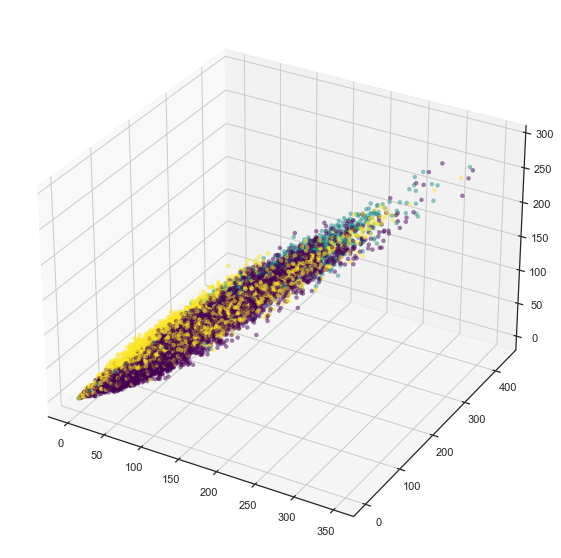

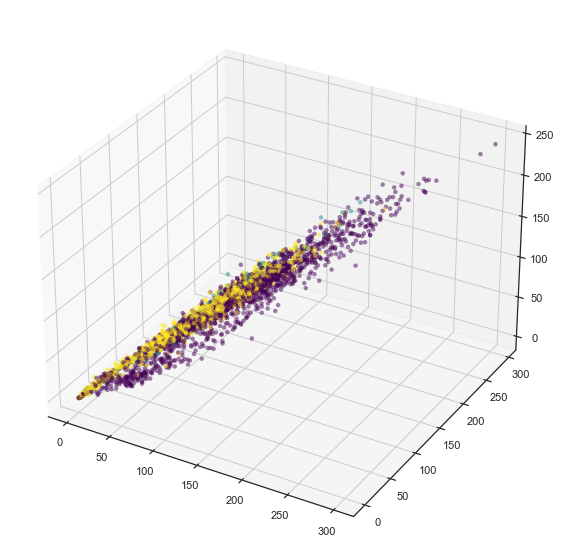

accuracy: 

0.6130952380952381

adjusted balanced accuracy: 

0.07926800488400197

f1: 

0.5026547619509336

geometric mean: 

0.16570938291683862

roc auc: 

Pandas Apply: 100%|██████████| 3360/3360 [00:00<00:00, 86091.67it/s]


0.5395181063618132

-- Epoch 1
Norm: 2.44, NNZs: 2048, Bias: -3.330160, T: 8708, Avg. loss: 0.381215
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.441786, T: 17416, Avg. loss: 0.430769
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 2.53, NNZs: 2048, Bias: -3.504407, T: 26124, Avg. loss: 0.441010
Total training time: 0.12 seconds.
-- Epoch 4
Norm: 2.55, NNZs: 2048, Bias: -3.543305, T: 34832, Avg. loss: 0.453409
Total training time: 0.30 seconds.
-- Epoch 5
Norm: 2.56, NNZs: 2048, Bias: -3.575862, T: 43540, Avg. loss: 0.455392
Total training time: 0.42 seconds.
-- Epoch 6
Norm: 2.57, NNZs: 2048, Bias: -3.598649, T: 52248, Avg. loss: 0.463562
Total training time: 0.56 seconds.
Convergence after 6 epochs took 0.56 seconds
-- Epoch 1
Norm: 2.51, NNZs: 2048, Bias: -3.845877, T: 2936, Avg. loss: 0.311835
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.61, NNZs: 2048, Bias: -4.047860, T: 5872, Avg. loss: 0.361203
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 2.67,

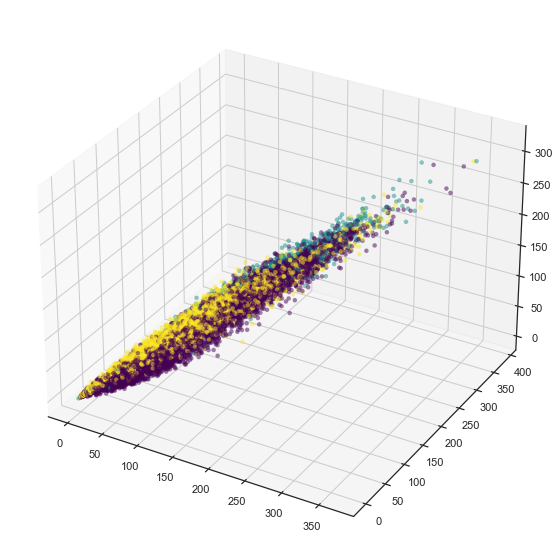

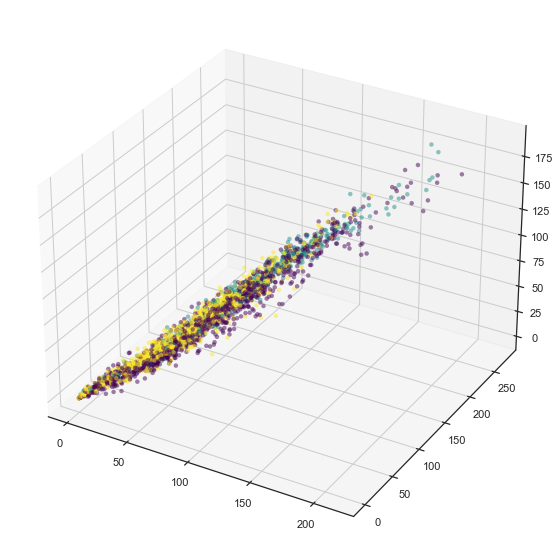

accuracy: 

0.4331572531491264

adjusted balanced accuracy: 

0.0847830892501771

f1: 

0.3455729420237474

geometric mean: 

0.2185840860100824

roc auc: 

Pandas Apply: 100%|██████████| 2461/2461 [00:00<00:00, 48221.88it/s]


0.5398947780627373

-- Epoch 1
Norm: 2.41, NNZs: 2048, Bias: -3.179556, T: 8154, Avg. loss: 0.380827
Total training time: 0.21 seconds.
-- Epoch 2
Norm: 2.45, NNZs: 2048, Bias: -3.300474, T: 16308, Avg. loss: 0.418376
Total training time: 0.26 seconds.
-- Epoch 3
Norm: 2.48, NNZs: 2048, Bias: -3.356025, T: 24462, Avg. loss: 0.441136
Total training time: 0.34 seconds.
-- Epoch 4
Norm: 2.50, NNZs: 2048, Bias: -3.399257, T: 32616, Avg. loss: 0.447199
Total training time: 0.40 seconds.
-- Epoch 5
Norm: 2.51, NNZs: 2048, Bias: -3.429162, T: 40770, Avg. loss: 0.454426
Total training time: 0.50 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 2048, Bias: -3.452580, T: 48924, Avg. loss: 0.460470
Total training time: 0.58 seconds.
Convergence after 6 epochs took 0.58 seconds
-- Epoch 1
Norm: 2.53, NNZs: 2048, Bias: -3.650849, T: 3114, Avg. loss: 0.283790
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.61, NNZs: 2048, Bias: -3.832237, T: 6228, Avg. loss: 0.325970
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2.65,

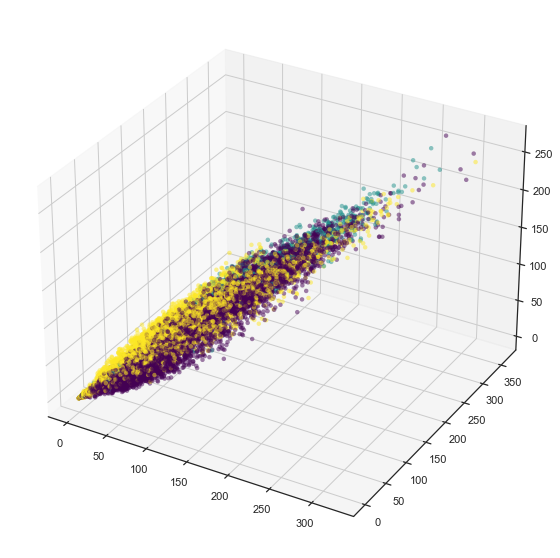

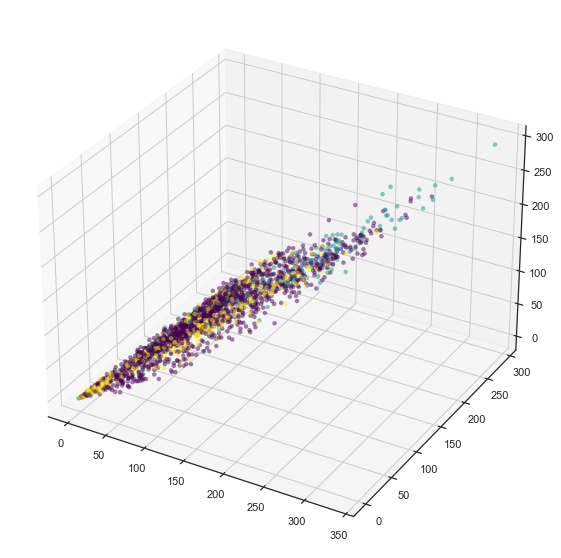

accuracy: 

0.5647607934655776

adjusted balanced accuracy: 

0.07422886399542626

f1: 

0.4897786453306831

geometric mean: 

0.09518739266236516

roc auc: 

Pandas Apply: 100%|██████████| 2571/2571 [00:00<00:00, 85627.95it/s]


0.538407238873514

-- Epoch 1
Norm: 2.33, NNZs: 2048, Bias: -2.796767, T: 6297, Avg. loss: 0.327470
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2.38, NNZs: 2048, Bias: -2.886671, T: 12594, Avg. loss: 0.360874
Total training time: 0.09 seconds.
-- Epoch 3
Norm: 2.41, NNZs: 2048, Bias: -2.929721, T: 18891, Avg. loss: 0.370353
Total training time: 0.17 seconds.
-- Epoch 4
Norm: 2.42, NNZs: 2048, Bias: -2.960396, T: 25188, Avg. loss: 0.372199
Total training time: 0.25 seconds.
-- Epoch 5
Norm: 2.43, NNZs: 2048, Bias: -2.982739, T: 31485, Avg. loss: 0.377911
Total training time: 0.32 seconds.
-- Epoch 6
Norm: 2.45, NNZs: 2048, Bias: -2.997554, T: 37782, Avg. loss: 0.381805
Total training time: 0.44 seconds.
Convergence after 6 epochs took 0.44 seconds
-- Epoch 1
Norm: 2.48, NNZs: 2048, Bias: -3.365610, T: 2385, Avg. loss: 0.283466
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.56, NNZs: 2048, Bias: -3.526329, T: 4770, Avg. loss: 0.317641
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2.59,

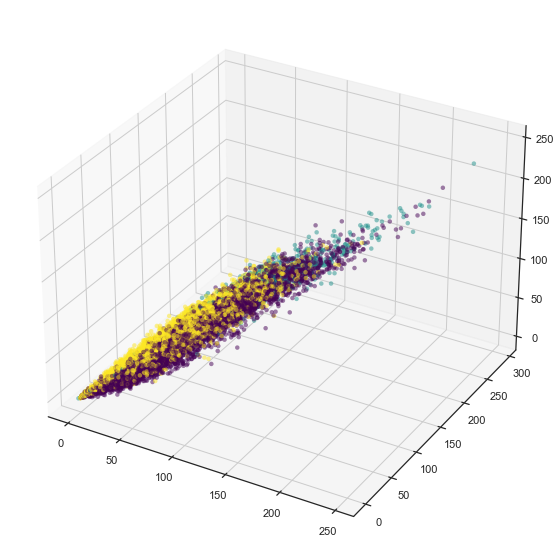

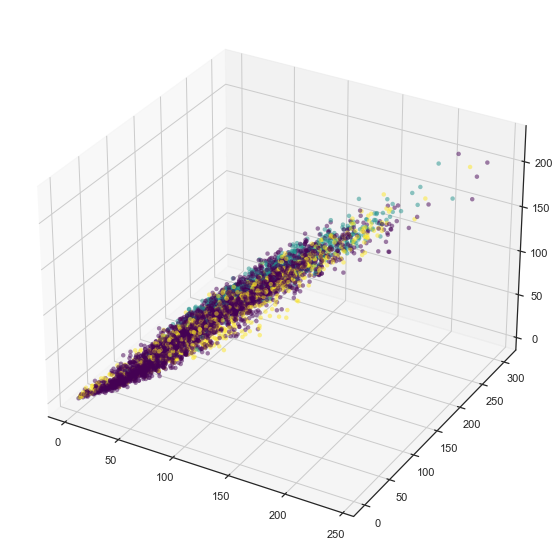

accuracy: 

0.600428494911623

adjusted balanced accuracy: 

0.0891905859998161

f1: 

0.5391258362718175

geometric mean: 

0.2011509498395956

roc auc: 

Pandas Apply: 100%|██████████| 5601/5601 [00:00<00:00, 26276.88it/s]


0.5485230850564378

-- Epoch 1
Norm: 2.46, NNZs: 2048, Bias: -3.373722, T: 8010, Avg. loss: 0.395347
Total training time: 0.06 seconds.
-- Epoch 2
Norm: 2.51, NNZs: 2048, Bias: -3.491986, T: 16020, Avg. loss: 0.440089
Total training time: 0.12 seconds.
-- Epoch 3
Norm: 2.54, NNZs: 2048, Bias: -3.552153, T: 24030, Avg. loss: 0.456730
Total training time: 0.26 seconds.
-- Epoch 4
Norm: 2.55, NNZs: 2048, Bias: -3.593055, T: 32040, Avg. loss: 0.466459
Total training time: 0.34 seconds.
-- Epoch 5
Norm: 2.57, NNZs: 2048, Bias: -3.623898, T: 40050, Avg. loss: 0.473158
Total training time: 0.50 seconds.
-- Epoch 6
Norm: 2.58, NNZs: 2048, Bias: -3.648257, T: 48060, Avg. loss: 0.479039
Total training time: 0.65 seconds.
Convergence after 6 epochs took 0.66 seconds
-- Epoch 1
Norm: 2.51, NNZs: 2048, Bias: -3.724119, T: 2550, Avg. loss: 0.302786
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.60, NNZs: 2048, Bias: -3.929048, T: 5100, Avg. loss: 0.352011
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.65,

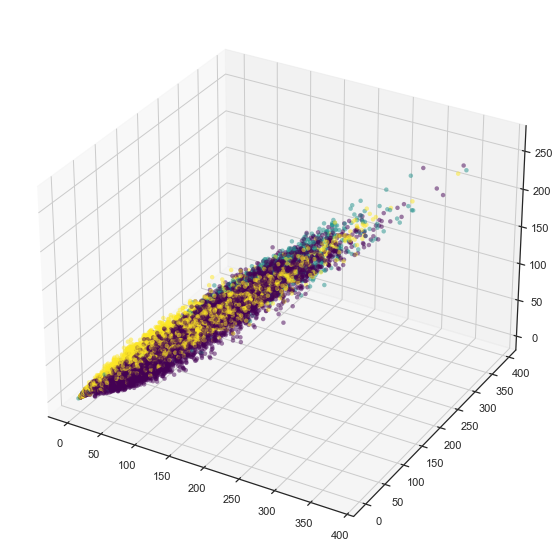

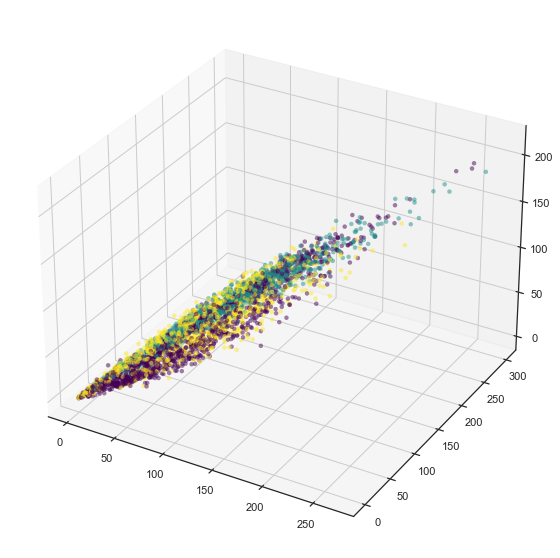

accuracy: 

0.48355795148247976

adjusted balanced accuracy: 

0.08521950443483207

f1: 

0.4057839388938247

geometric mean: 

0.2515402265902298

roc auc: 

Pandas Apply: 100%|██████████| 3710/3710 [00:00<00:00, 66205.19it/s]


0.5456537802147223

time: 48.6 s


In [32]:
def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


accuracy, adjusted_balanced_accuracy, f1, geometric_mean, roc_auc = (
    [] for _ in range(5)
)
for train_idx, test_idx in StratifiedGroupKFold(shuffle=True, random_state=SEED).split(
    data, y=labels.valence, groups=labels.speaker_id
):
    x_train = data.iloc[train_idx]
    neg_data = x_train.loc[labels.valence == 0]
    neu_data = x_train.loc[labels.valence == 1]
    pos_data = x_train.loc[labels.valence == 2]

    neg_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(neg_data)
    neu_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(neu_data)
    pos_classifier = SGDOneClassSVM(verbose=1, random_state=SEED).fit(pos_data)
    model = RidgeClassifier(random_state=SEED).fit(
        x_train := pd.DataFrame(
            {
                "oc_neg": neg_classifier.score_samples(x_train) ** 3,
                "oc_neu": neu_classifier.score_samples(x_train) ** 3,
                "oc_pos": pos_classifier.score_samples(x_train) ** 3,
            }
        ),
        y_train := labels.iloc[train_idx].loc[:, "valence"],
    )
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        x_train.loc[:, "oc_neg"],
        x_train.loc[:, "oc_neu"],
        x_train.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    plt.show()

    X_test = data.iloc[test_idx]
    X_test = pd.DataFrame(
        {
            "oc_neg": neg_classifier.score_samples(X_test) ** 3,
            "oc_neu": neu_classifier.score_samples(X_test) ** 3,
            "oc_pos": pos_classifier.score_samples(X_test) ** 3,
        }
    )
    score_params = {
        "y_true": labels.valence.iloc[test_idx],
        "y_pred": model.predict(X_test),
    }
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    sns.set_style("ticks")
    ax.scatter(
        X_test.loc[:, "oc_neg"],
        X_test.loc[:, "oc_neu"],
        X_test.loc[:, "oc_pos"],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=score_params["y_true"],
    )
    plt.show()
    print("accuracy: ", end="")
    _ = accuracy_score(**score_params)
    _
    accuracy.append(_)
    print("adjusted balanced accuracy: ", end="")
    _ = balanced_accuracy_score(**score_params, adjusted=True)
    _
    adjusted_balanced_accuracy.append(_)
    print("f1: ", end="")
    _ = f1_score(**score_params, average="weighted")
    _
    f1.append(_)
    print("geometric mean: ", end="")
    _ = geometric_mean_score(**score_params)
    _
    geometric_mean.append(_)
    print("roc auc: ", end="")
    _ = roc_auc_score(
        y_true=score_params["y_true"],
        y_score=np.stack(
            pd.Series(score_params["y_pred"]).swifter.apply(prep_y_pred).values
        ),
        average="weighted",
        multi_class="ovo",
    )
    _
    roc_auc.append(_)

In [33]:
print("accuracy: ", np.mean(accuracy))
print("adjusted balanced accuracy: ", np.mean(adjusted_balanced_accuracy))
print("f1", np.mean(f1))
print("geometric mean: ", np.mean(geometric_mean))
print("roc_auc: ", np.mean(roc_auc))

_ = gc_collect()

accuracy:  0.538999946220809
adjusted balanced accuracy:  0.0825380097128507
f1 0.4565832248942012
geometric mean:  0.1864344076038223
roc_auc:  0.5423993977138449
time: 584 ms


SGD on LDA
* **accuracy:  0.5919834440397561**
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

rbf on LDA
* accuracy:  0.5885365691409195
* adjusted balanced accuracy:  0.2787460612671587
* f1 0.5740775730084442
* geometric mean:  0.4801355121602585
* roc_auc:  0.6373716819063435

sigmoid on LDA
* accuracy:  0.59008845492141
* **adjusted balanced accuracy:  0.2865769047545627**
* **f1:  0.5777380370333021**
* **geometric mean:  0.4901462758148444**
* **roc_auc:  0.6419628513559051**

poly on LDA
* accuracy:  0.5670729078004833
* adjusted balanced accuracy:  0.09080716282986434
* f1 0.4708749263106059
* geometric mean:  0.2204210842991257
* roc_auc:  0.5451307251182953

linear on LDA (same as SGD on LDA)
* **accuracy:  0.5919834440397561**
* adjusted balanced accuracy:  0.27797108499482526
* f1 0.5767885727361184
* geometric mean:  0.48109967574634876
* roc_auc:  0.637515842210109

SGD on FRILL
* accuracy:  0.5442113792713357
* adjusted balanced accuracy:  0.06859747163164584
* f1 0.4581272881940137
* geometric mean:  0.20146903965601815
* roc_auc:  0.5357471019921884

Nystroem
* accuracy:  0.5477829908091535
* adjusted balanced accuracy:  0.05576221921431891
* f1 0.4281193115297038
* geometric mean:  0.11954510014096593
* roc_auc:  0.5276542424662795

SGD on FRILL **3
* accuracy:  0.538999946220809
* adjusted balanced accuracy:  0.0825380097128507
* f1 0.4565832248942012
* geometric mean:  0.1864344076038223
* roc_auc:  0.5423993977138449

I guess the next step is to extract these and test some models.

In [11]:
print(f"Time elapsed since notebook_begin_time: {time() - notebook_begin_time} s")
_ = gc_collect()

Time elapsed since notebook_begin_time: 2918.5402405261993 s
time: 263 ms


[^top](#Contents)